# Instruction to lab work # 2: Dive deeper into principles of classification methods

> Student name    - Maksym

> Student surname - Maliutin

> Group           - CS-31


# Task description

## Part 1 (playing with generated data)

1. Set your `STUDENT_ID`, which is used as random seed, and makes your data looks a bit different.
2. Looks through `1.3. Example of using tool & experiments`, use all provided data in your experiments. But you can generate your own (more interesting & complex artificial data from your perspective)
3. In the `1.4. Task & your experiments` part do your experiments, as described select all (or a few) datasets and conduct experiments with each of the proposed methods. The idea here is to understand how various configurations of hyperparameters influence on space separations. Consider using provided hints.
4. Don't forget to write your conclusions & observations.

## Part 2 (working on the real classification problem)

1. Select 1-3 the most fascinating classification method depending on your taste.
2. Select 1 of the provided (look at the section bellow) real data for experiment.
3. Conduct experiments as shown in the example on [GitHub Repo](https://github.com/VolDonets/ML_basics_course/tree/master/lab_works/lab_3)
4. But consider tuning hyperparameters of your selected models as it was in this work and observe performance.
5. **BONUS** (+2 points): take modify function `def plot_classifier_boundary_by_dots(X, y, model=None, title=None, n_background_points=10_000): ...` to visualize decision boundaries on your real data from experiments. Hint: Here you need fit `PCA(n_components=2)` on the `X` data and used it on `X` and on `X_background` before visualizing. Also, consider that `X` and `X_background` should have the same dimension. Be aware that such visualizing might looks weird cause PCA might weirdly transform evenly distributed data in `X_background`, and it's OK.

## Proposition of the real data for experiments (for the part 2)

1. [Liver Cirrhosis Stage Classification](https://www.kaggle.com/datasets/aadarshvelu/liver-cirrhosis-stage-classification)
2. [Star Dataset for Stellar Classification](https://www.kaggle.com/datasets/vinesmsuic/star-categorization-giants-and-dwarfs)
3. [Fitness Classification Dataset](https://www.kaggle.com/datasets/muhammedderric/fitness-classification-dataset-synthetic)
4. [ECG Arrhythmia Classification Dataset](https://www.kaggle.com/datasets/sadmansakib7/ecg-arrhythmia-classification-dataset)
5. [Mushroom Classification Enhanced](https://www.kaggle.com/datasets/sakurapuare/mushroom-classification-enhanced)
6. [Dry Bean Dataset Classification](https://www.kaggle.com/datasets/nimapourmoradi/dry-bean-dataset-classification)
7. [Swarm Behaviour Classification](https://www.kaggle.com/datasets/deepcontractor/swarm-behaviour-classification) -- challenging one 270 Mb dataset
8. [Anemia Types Classification](https://www.kaggle.com/datasets/ehababoelnaga/anemia-types-classification)
9. [NASA: Asteroids Classification](https://www.kaggle.com/datasets/shrutimehta/nasa-asteroids-classification)


# Part 1: experiments with artificial data

In [9]:
STUDENT_ID = 12

## 1.1. Import dependencies

In [10]:
import numpy as np
import pandas as pd

from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, VotingClassifier

from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

import matplotlib.pyplot as plt
import seaborn as sns

## 1.2. Tool functions

### 1.2.1. Kernel function for data generation

In [11]:
def gaussian_kernel(center):
    """Factory for a kernel that generates a blob of points."""

    # The returned function takes n_points and generates them around the specified center.
    return lambda n: np.repeat(np.array([center]), n, axis=0)


def circle_kernel(radius, start_angle=0, end_angle=2 * np.pi):
    """Factory for a kernel that generates points on a circle or arc."""

    def _kernel(n):
        theta = np.linspace(start_angle, end_angle, n)
        x = radius * np.cos(theta)
        y = radius * np.sin(theta)
        return np.vstack([x, y]).T

    return _kernel


def spiral_kernel(rotations=1.5, start_radius=1.0):
    """Factory for a kernel that generates points in a spiral."""

    def _kernel(n):
        theta = np.linspace(0, rotations * 2 * np.pi, n)
        radius = np.linspace(start_radius, start_radius + (rotations * 2), n)
        x = radius * np.cos(theta)
        y = radius * np.sin(theta)
        return np.vstack([x, y]).T

    return _kernel


def sine_wave_kernel(amplitude=1, frequency=1, x_range=(-5, 5)):
    """Factory for a kernel that generates points along a sine wave."""

    def _kernel(n):
        x = np.linspace(x_range[0], x_range[1], n)
        y = amplitude * np.sin(frequency * x)
        return np.vstack([x, y]).T

    return _kernel


def exponential_kernel(amplitude=1, base=np.e, x_range=(-2, 2)):
    """Factory for a kernel that generates points along an exponential curve."""

    def _kernel(n):
        x = np.linspace(x_range[0], x_range[1], n)
        y = amplitude * (base ** x)
        return np.vstack([x, y]).T

    return _kernel

### 1.2.2. Data generation function

In [12]:
def generate_classification_data(n_samples=200, kernels=None, kernel_classes=None,
                                 dispersion=0.2, n_outliers=10, random_seed=42):
    """
    Generates 2D, multi-class data using a flexible kernel-based approach.

    :param n_samples: The total number of data points to generate.
    :param kernels: A list of kernel functions. Each function defines a class and should
                    accept 'n' (number of points) and return an array of shape [n, 2].
    :param kernel_classes: A list of integers mapping each kernel to a class label.
                           Its length must match the length of `kernels`. If None, each kernel
                           is assigned a unique class (e.g., [0, 1, 2, ...]).
    :param dispersion: The standard deviation of Gaussian noise added to each point.
    :param n_outliers: The number of completely random points (noise) to add.
    :param random_seed: A seed for the random number generator for reproducibility.
    :returns: A tuple (X, y) where X is the feature matrix [n_samples, 2]
              and y is the label vector [n_samples,].
    """
    np.random.seed(random_seed)

    if kernels is None:
        kernels = [gaussian_kernel(center=[2, 2]),
                   gaussian_kernel(center=[-2, -2])]

    if kernel_classes is None:
        kernel_classes = list(range(len(kernels)))

    if len(kernels) != len(kernel_classes):
        raise ValueError("The length of 'kernels' and 'kernel_classes' must be the same.")

    n_classes = len(np.unique(kernel_classes))
    n_inliers = n_samples - n_outliers
    if n_inliers <= 0:
        raise ValueError("n_samples must be greater than n_outliers.")

    points_per_kernel = n_inliers // len(kernels)

    X_parts, y_parts = [], []
    for i, kernel in enumerate(kernels):
        class_label = kernel_classes[i]

        # --- THE FIX IS ON THIS LINE ---
        # Ensure the kernel output is float before adding float-based dispersion
        X_class = kernel(points_per_kernel).astype(float)

        X_class += np.random.randn(points_per_kernel, 2) * dispersion
        y_class = np.full(points_per_kernel, class_label)

        X_parts.append(X_class)
        y_parts.append(y_class)

    X_inliers = np.vstack(X_parts)
    y_inliers = np.hstack(y_parts)

    if n_outliers > 0:
        x_min, x_max = X_inliers[:, 0].min(), X_inliers[:, 0].max()
        y_min, y_max = X_inliers[:, 1].min(), X_inliers[:, 1].max()
        padding = (max(x_max - x_min, y_max - y_min)) * 0.1

        X_outliers = np.random.uniform(min(x_min, y_min) - padding,
                                       max(x_max, y_max) + padding,
                                       size=(n_outliers, 2))
        y_outliers = np.random.randint(0, n_classes, size=n_outliers)

        X = np.vstack([X_inliers, X_outliers])
        y = np.hstack([y_inliers, y_outliers])
    else:
        X, y = X_inliers, y_inliers

    permutation = np.random.permutation(X.shape[0])
    X, y = X[permutation], y[permutation]

    return X, y

### 1.2.3. Classification visualization function

In [13]:
# This function uses dots to visualize data
# You can use it if you wish (it looks like experiments in physics with electrons).

def plot_classifier_boundary_by_dots(X, y, model=None, title=None, n_background_points=10_000):
    """
    Visualizes classifier decision boundaries or acts as a simple data scatter plot.

    If a model is provided, it plots the decision regions.
    If model is None, it only plots the data points.

    :param X: The feature matrix, shape (n_samples, 2).
    :param y: The true label vector, shape (n_samples,).
    :param model: A trained scikit-learn classifier object. Optional.
    :param title: The title for the plot. A default is used if None.
    :param n_background_points: The number of random points for visualizing the background.
    """
    plt.style.use('seaborn-v0_8-pastel')
    fig, ax = plt.subplots(figsize=(8, 8))

    # 1. Plot the background decision regions only if a model is provided
    if model is not None:
        x1_min, x1_max = X[:, 0].min(), X[:, 0].max()
        x2_min, x2_max = X[:, 1].min(), X[:, 1].max()
        x1_pad = (x1_max - x1_min) * 0.1
        x2_pad = (x2_max - x2_min) * 0.1
        plot_x1_min, plot_x1_max = x1_min - x1_pad, x1_max + x1_pad
        plot_x2_min, plot_x2_max = x2_min - x2_pad, x2_max + x2_pad

        X_background = np.random.uniform(
            low=[plot_x1_min, plot_x2_min],
            high=[plot_x1_max, plot_x2_max],
            size=(n_background_points, 2)
        )
        background_preds = model.predict(X_background)
        
        ax.scatter(X_background[:, 0], X_background[:, 1], c=background_preds,
                   cmap=plt.cm.coolwarm, s=10, alpha=0.2, zorder=0)

    # 2. Plot the original data points
    scatter = ax.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.coolwarm, edgecolors='k', alpha=1.0, zorder=2)

    # 3. Set a dynamic title if none is provided
    if title is None:
        title = "Classifier Decision Boundary" if model is not None else "Data Scatter Plot"
    
    ax.set_xlabel("Feature 1", fontsize=12)
    ax.set_ylabel("Feature 2", fontsize=12)
    ax.set_title(title, fontsize=14, weight='bold')

    # --- Legend Creation ---
    handles, _ = scatter.legend_elements()
    num_classes = len(np.unique(y))
    class_labels = [f'Class {i}' for i in range(num_classes)]
    ax.legend(handles=handles, labels=class_labels, loc='upper right', fontsize=11)
    
    if model is not None:
        ax.set_xlim(plot_x1_min, plot_x1_max)
        ax.set_ylim(plot_x2_min, plot_x2_max)
    
    plt.show()

In [14]:
def plot_classifier_boundary(X, y, model=None, title=None, resolution=200):
    """
    Visualizes classifier decision boundaries using a high-resolution, evenly-spaced grid.

    If a model is provided, it plots the decision regions.
    If model is None, it only plots the data points.

    :param X: The feature matrix, shape (n_samples, 2).
    :param y: The true label vector, shape (n_samples,).
    :param model: A trained scikit-learn classifier object. Optional.
    :param title: The title for the plot. A default is used if None.
    :param resolution: The number of points to use per axis for the background grid.
    """
    plt.style.use('seaborn-v0_8-pastel')
    fig, ax = plt.subplots(figsize=(8, 8))

    # Plot the background decision regions only if a model is provided
    if model is not None:
        # 1. Define the plot boundaries with a 10% padding
        x1_min, x1_max = X[:, 0].min(), X[:, 0].max()
        x2_min, x2_max = X[:, 1].min(), X[:, 1].max()
        x1_pad = (x1_max - x1_min) * 0.2
        x2_pad = (x2_max - x2_min) * 0.2
        plot_x1_min, plot_x1_max = x1_min - x1_pad, x1_max + x1_pad
        plot_x2_min, plot_x2_max = x2_min - x2_pad, x2_max + x2_pad

        # 2. Create a high-resolution, evenly-spaced grid of points
        xx1, xx2 = np.meshgrid(
            np.linspace(plot_x1_min, plot_x1_max, resolution),
            np.linspace(plot_x2_min, plot_x2_max, resolution)
        )
        
        # 3. Get the model's prediction for every point on the grid
        # We flatten the grid to pass it to the model, then reshape the predictions back
        grid_points = np.c_[xx1.ravel(), xx2.ravel()]
        Z = model.predict(grid_points)
        Z = Z.reshape(xx1.shape)
        
        # 4. Plot the regions using filled contours
        ax.contourf(xx1, xx2, Z, cmap=plt.cm.coolwarm, alpha=0.6)

    # 5. Plot the original data points on top
    scatter = ax.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.coolwarm, edgecolors='k', alpha=1.0, zorder=2)

    # Set a dynamic title if none is provided
    if title is None:
        title = "Classifier Decision Boundary" if model is not None else "Data Scatter Plot"
    
    ax.set_xlabel("Feature 1", fontsize=12)
    ax.set_ylabel("Feature 2", fontsize=12)
    ax.set_title(title, fontsize=14, weight='bold')

    # --- Legend Creation ---
    handles, _ = scatter.legend_elements()
    num_classes = len(np.unique(y))
    class_labels = [f'Class {i}' for i in range(num_classes)]
    ax.legend(handles=handles, labels=class_labels, loc='upper right', fontsize=11)
    
    if model is not None:
        ax.set_xlim(plot_x1_min, plot_x1_max)
        ax.set_ylim(plot_x2_min, plot_x2_max)
    
    plt.show()

### 1.2.4. Classification score function

In [15]:
def show_classification_report(X, y_true, model, title="Classification Performance"):
    """
    Calculates and displays a report of key classification metrics.

    :param X: The feature matrix of the test data.
    :param y_true: The true labels of the test data.
    :param model: A trained scikit-learn classifier object with a .predict() method.
    :param title: The title for the report and plot.
    """
    # 1. Get the model's predictions for the test data
    y_pred = model.predict(X)
    
    # Determine if it's a binary or multi-class problem
    n_classes = len(np.unique(y_true))
    
    print(f"----- 📊 {title} -----")
    
    # 2. Calculate and print the main scores
    accuracy = accuracy_score(y_true, y_pred)
    print(f"Accuracy: {accuracy:.4f}")
    
    # For multi-class, we need to specify an averaging method for precision, recall, and F1
    if n_classes > 2:
        avg_method = 'weighted'
        print(f"(Scores below are averaged using the '{avg_method}' method for multi-class)")
    else:
        avg_method = 'binary'

    precision = precision_score(y_true, y_pred, average=avg_method)
    recall = recall_score(y_true, y_pred, average=avg_method)
    f1 = f1_score(y_true, y_pred, average=avg_method)

    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1-Score: {f1:.4f}")
    print("-" * (len(title) + 12))
    
    # 3. Calculate and visualize the confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    
    fig, ax = plt.subplots(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax, cbar=False)
    
    ax.set_title('Confusion Matrix', fontsize=14, weight='bold')
    ax.set_xlabel('Predicted Label', fontsize=12)
    ax.set_ylabel('True Label', fontsize=12)
    
    # Set tick labels for clarity
    class_labels = [f'Class {i}' for i in range(n_classes)]
    ax.set_xticklabels(class_labels)
    ax.set_yticklabels(class_labels, rotation=0)
    
    plt.show()

## 1.3. Example of using tool & experiments

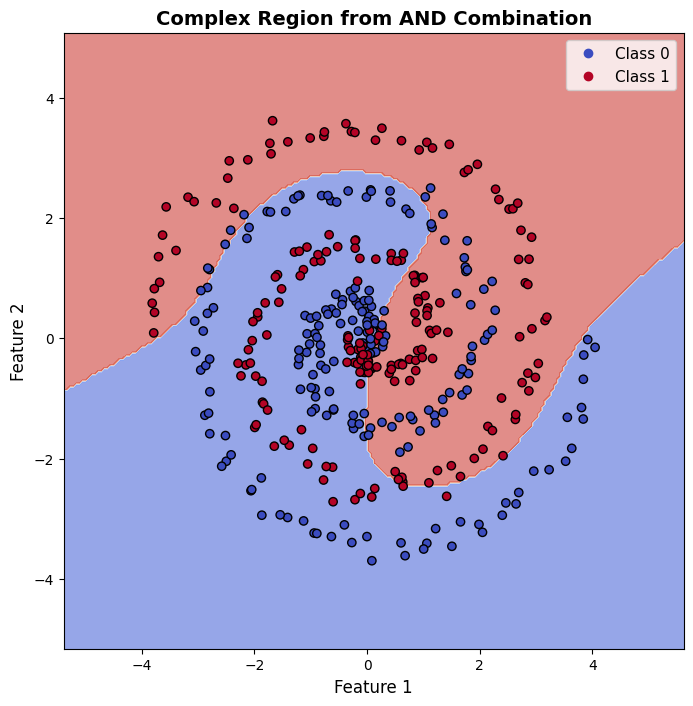

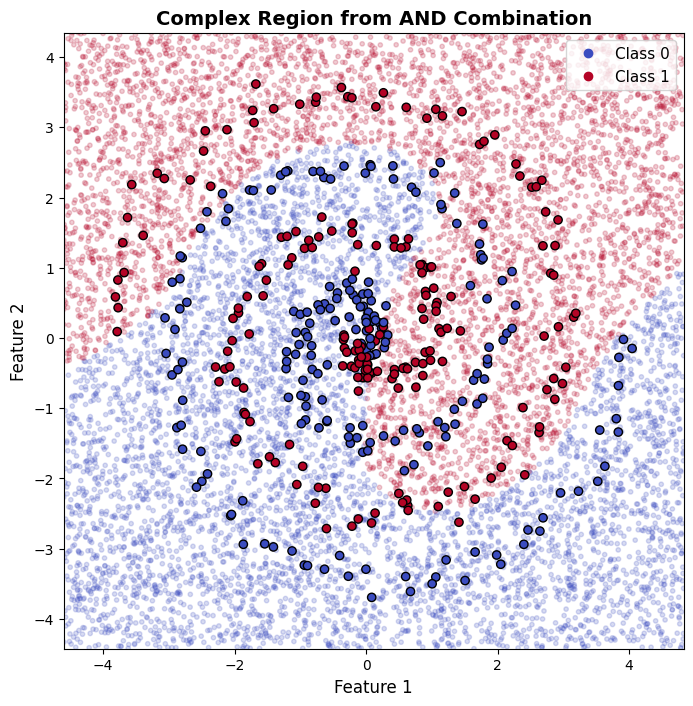

In [16]:
# Spiral data
X_data, y_data = generate_classification_data(
    n_samples=400,
    kernels=[
        spiral_kernel(rotations=2, start_radius=0),
        lambda n: -1 * spiral_kernel(rotations=2, start_radius=0)(n)  # Invert the second spiral
    ],
    kernel_classes=[0, 1],
    dispersion=0.15,
    n_outliers=0,
    random_seed=STUDENT_ID
)


# Train and test model
model = SVC(kernel="rbf")
model.fit(X_data, y_data)


# Plotting generated data
plot_classifier_boundary(X_data, y_data,
                       model=model,
                       title="Complex Region from AND Combination")

plot_classifier_boundary_by_dots(X_data, y_data,
                       model=model,
                       title="Complex Region from AND Combination")

----- 📊 Classification Performance -----
Accuracy: 0.6425
Precision: 0.6686
Recall: 0.5650
F1-Score: 0.6125
--------------------------------------


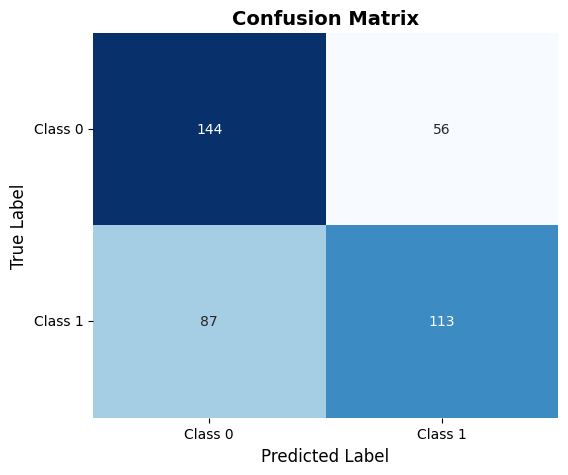

In [17]:
# Plot classification report
show_classification_report(X_data, y_data, model)

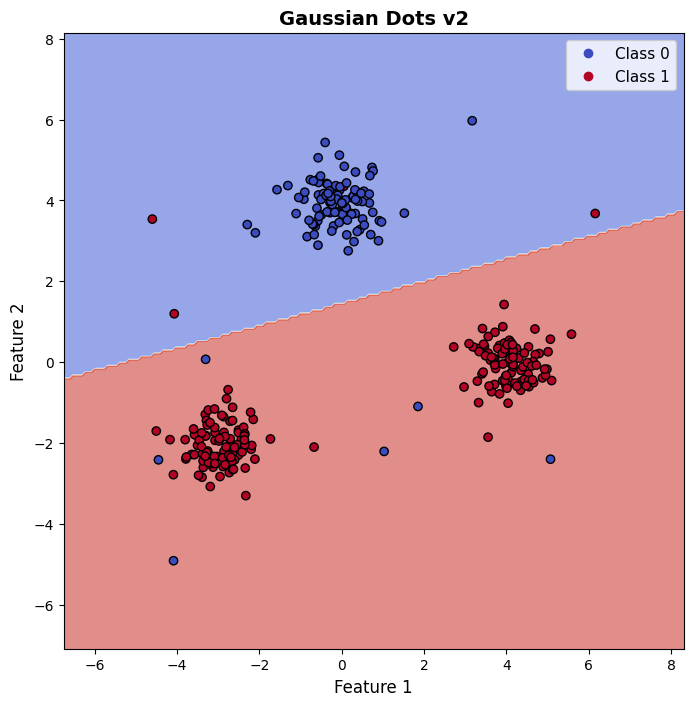

In [18]:
# Gaussian dots data v2
X_data, y_data = generate_classification_data(
    n_samples=300,
    kernels=[gaussian_kernel(center=[0, 4]),
             gaussian_kernel(center=[-3, -2]),
             gaussian_kernel(center=[4, 0]), ],
    kernel_classes=[0, 1, 1],
    dispersion=0.5,
    n_outliers=20,
    random_seed=STUDENT_ID,
)

# Train and test model
model = LogisticRegression()
model.fit(X_data, y_data)

# Plotting generated data
plot_classifier_boundary(X_data, y_data,
                       model=model,
                       title="Gaussian Dots v2")

----- 📊 Classification Performance -----
Accuracy: 0.9632
Precision: 0.9646
Recall: 0.9795
F1-Score: 0.9720
--------------------------------------


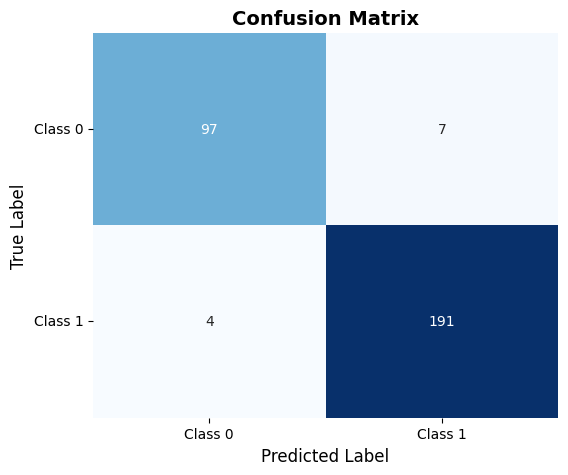

In [19]:
# Plot classification report
show_classification_report(X_data, y_data, model)

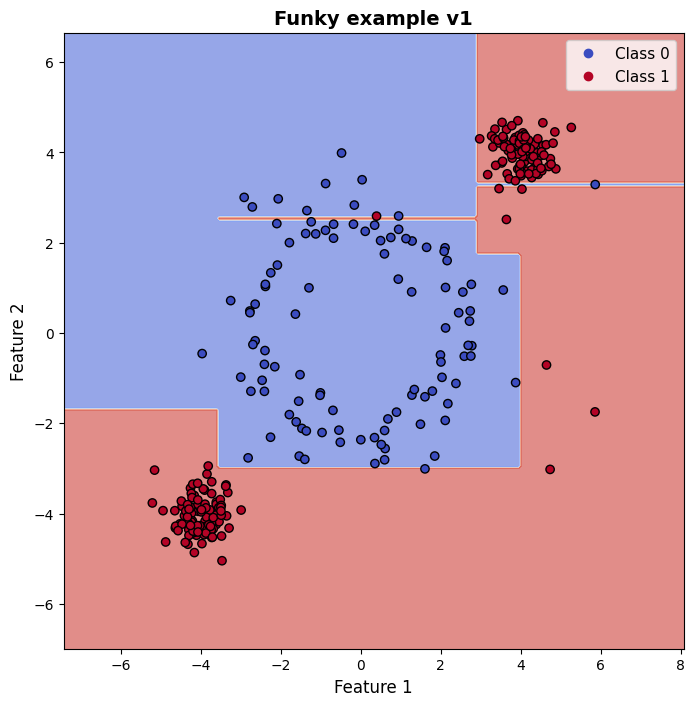

In [20]:
# Funky example v1
X_data, y_data = generate_classification_data(
    n_samples=300,
    kernels=[
        circle_kernel(radius=2.5),  # This will be for class 0
        gaussian_kernel(center=[-4, -4]),  # This will be part of class 1
        gaussian_kernel(center=[4, 4])  # This will also be part of class 1
    ],
    kernel_classes=[0, 1, 1],
    dispersion=0.4,
    n_outliers=15,
    random_seed=STUDENT_ID
)

# Train and test model
model = DecisionTreeClassifier()
model.fit(X_data, y_data)

# Plotting generated data
plot_classifier_boundary(X_data, y_data,
                       model=model,
                       title="Funky example v1")

----- 📊 Classification Performance -----
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1-Score: 1.0000
--------------------------------------


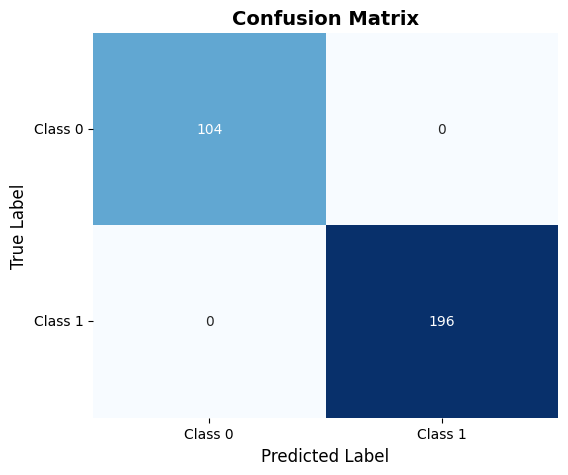

In [21]:
# Plot classification report
show_classification_report(X_data, y_data, model)

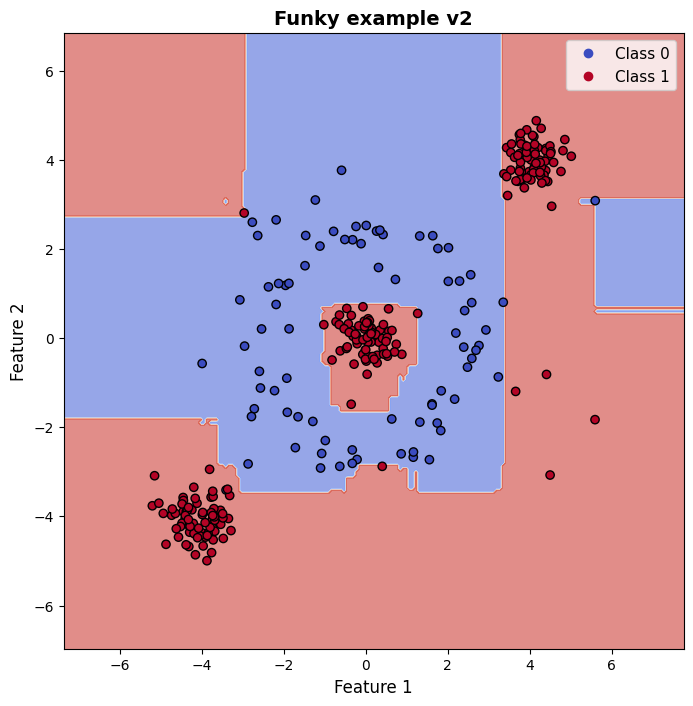

In [22]:
# Funky example v2
X_data, y_data = generate_classification_data(
    n_samples=300,
    kernels=[
        circle_kernel(radius=2.5),  # This will be for class 0
        gaussian_kernel(center=[-4, -4]),  # This will be part of class 1
        gaussian_kernel(center=[4, 4]),  # This will also be part of class 1
        gaussian_kernel(center=[0, 0]),  # This will also be part of class 1
    ],
    kernel_classes=[0, 1, 1, 1],
    dispersion=0.4,
    n_outliers=15,
    random_seed=STUDENT_ID
)

# Train and test model
model = RandomForestClassifier()
model.fit(X_data, y_data)

# Plotting generated data
plot_classifier_boundary(X_data, y_data,
                       model=model,
                       title="Funky example v2")

----- 📊 Classification Performance -----
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1-Score: 1.0000
--------------------------------------


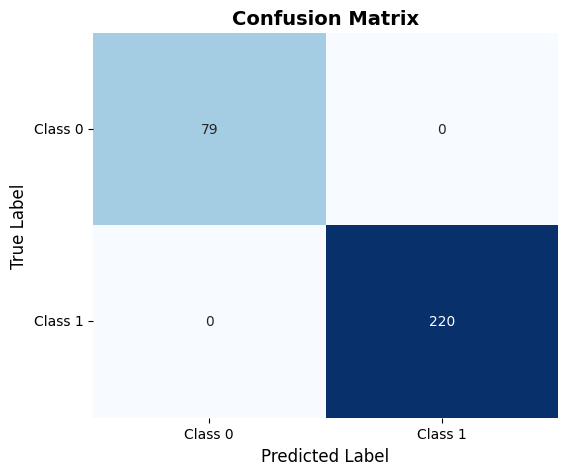

In [23]:
# Plot classification report
show_classification_report(X_data, y_data, model)

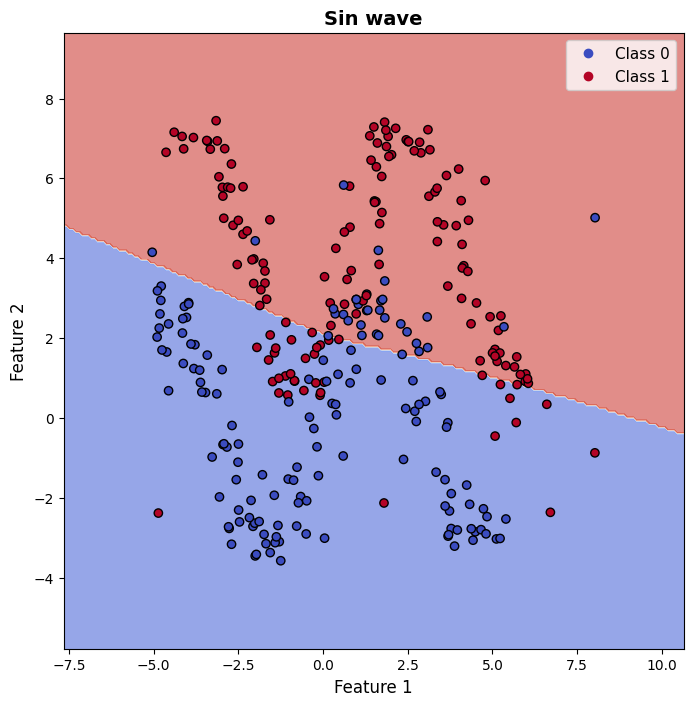

In [24]:
# Sin wave
X_data, y_data = generate_classification_data(
    n_samples=300,
    kernels=[
        lambda x_: sine_wave_kernel(amplitude=3, frequency=1, x_range=[-5, 5])(x_),
        lambda x_: 4 + sine_wave_kernel(amplitude=-3, frequency=1, x_range=[-8, 2])(x_),
    ],
    kernel_classes=[0, 1],
    dispersion=0.4,
    n_outliers=15,
    random_seed=STUDENT_ID
)

# Train and test model
clf1 = LogisticRegression()
clf2 = GaussianNB()
model = VotingClassifier(estimators=[
        ('lr', clf1), ('gnb', clf2)], voting='hard')
model.fit(X_data, y_data)

# Plotting generated data
plot_classifier_boundary(X_data, y_data,
                       model=model,
                       title="Sin wave")

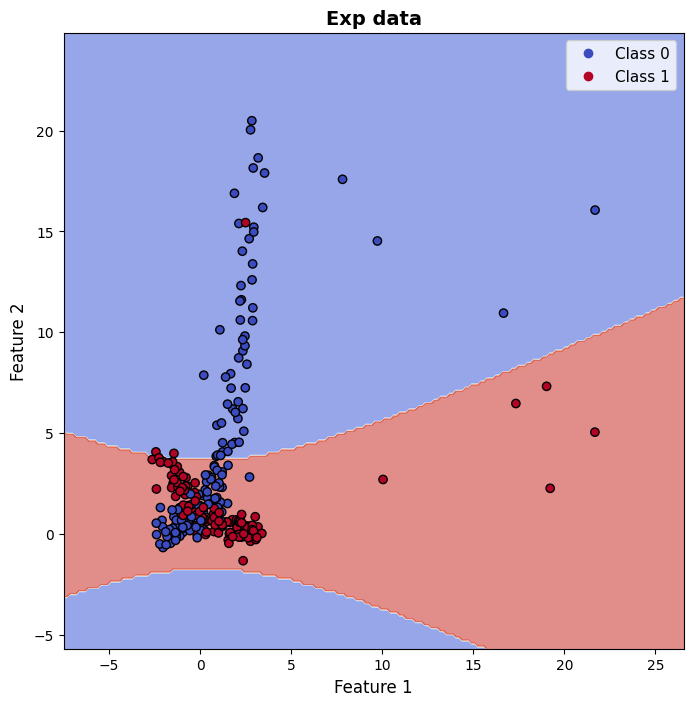

In [25]:
# Exp data
X_data, y_data = generate_classification_data(
    n_samples=300,
    kernels=[
        # Class 0: Exponential growth
        exponential_kernel(amplitude=1, base=np.e, x_range=(-2, 3)),
        # Class 1: Exponential decay
        exponential_kernel(amplitude=1, base=0.5, x_range=(-2, 3))
    ],
    dispersion=0.4,
    n_outliers=15,
    random_seed=STUDENT_ID
)

# Train and test model
model = GaussianNB()
model.fit(X_data, y_data)

# Plotting generated data
plot_classifier_boundary(X_data, y_data,
                       model=model,
                       title="Exp data")

----- 📊 Classification Performance -----
Accuracy: 0.6689
Precision: 0.6033
Recall: 0.9799
F1-Score: 0.7468
--------------------------------------


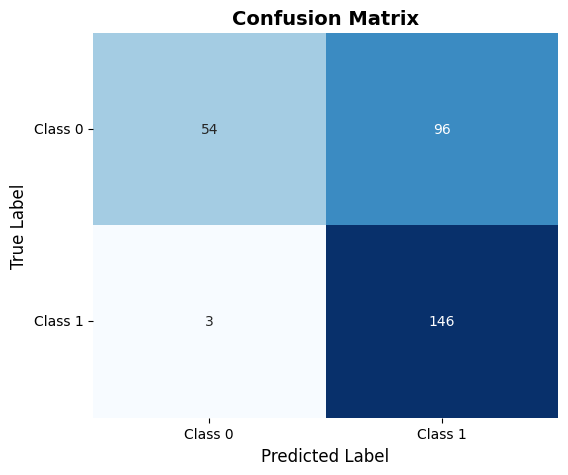

In [26]:
# Plot classification report
show_classification_report(X_data, y_data, model)

## 1.4. Task & your experiments

Using provided artificial data (or your own data, you can make, as complex as you wish) do experiments on each of the proposed model.
Make them work better and worse. Observe in changing `accuracy`, `precision`, `recall`, and `f1-score` depending on your data and models' configurations.
Make conclusions in the end: like what model is the most universal/simple/complex and why. Which model's hyperparameters has the biggest impact on the model's performance. 
Also conduct as least 3 experiment on each model. 

### 1.4.1. Experiment on `GaussianNB`

**Hint**: `var_smoothing`: This is the most important (and often only) parameter to adjust.

  * _What it does_: It's a stability parameter that adds a small value to the variance of each feature. This prevents issues if a feature has zero variance in your training data. Think of it as a safety net to prevent the model from becoming too certain based on limited data.
  * _What to try_: It's a small float. Experiment with values like `1e-10`, `1e-9` (default), `1e-7`, `1e-5`.
  * _Expected effect_: Increasing var_smoothing can make the model more robust to noisy features (reducing overfitting), but making it too large will "smooth out" the data too much, leading to underfitting.


=== GaussianNB(var_smoothing=1e-10) ===
----- 📊 GaussianNB var_smoothing=1e-10 -----
Accuracy: 0.9875
Precision: 0.9802
Recall: 0.9950
F1-Score: 0.9875
------------------------------------------


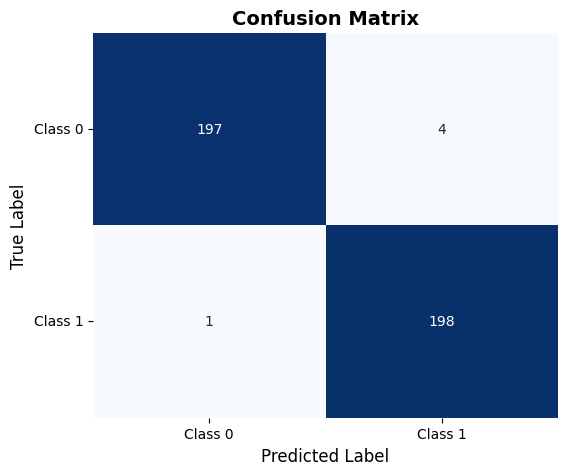

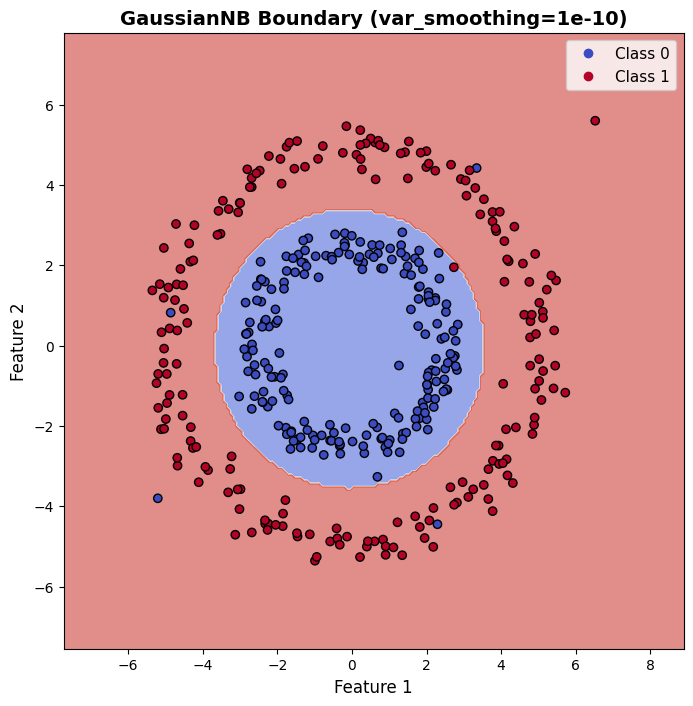


=== GaussianNB(var_smoothing=1e-09) ===
----- 📊 GaussianNB var_smoothing=1e-09 -----
Accuracy: 0.9875
Precision: 0.9802
Recall: 0.9950
F1-Score: 0.9875
------------------------------------------


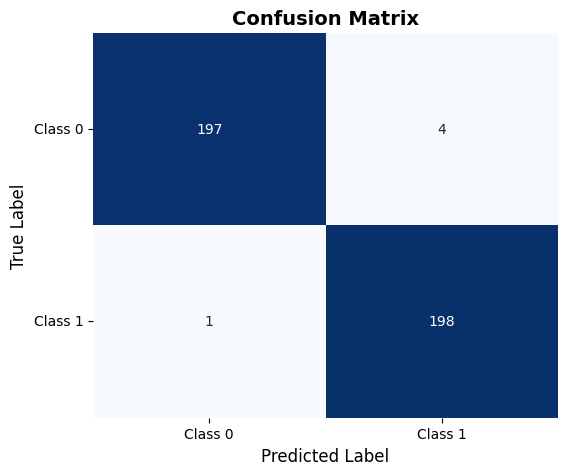

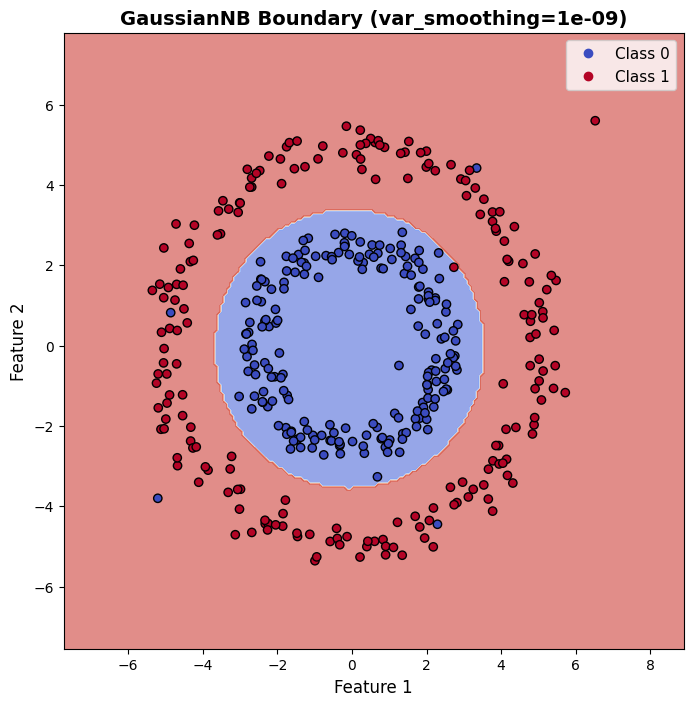


=== GaussianNB(var_smoothing=1e-07) ===
----- 📊 GaussianNB var_smoothing=1e-07 -----
Accuracy: 0.9875
Precision: 0.9802
Recall: 0.9950
F1-Score: 0.9875
------------------------------------------


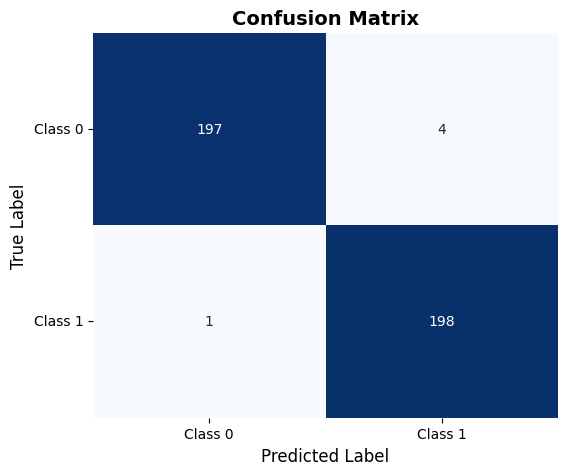

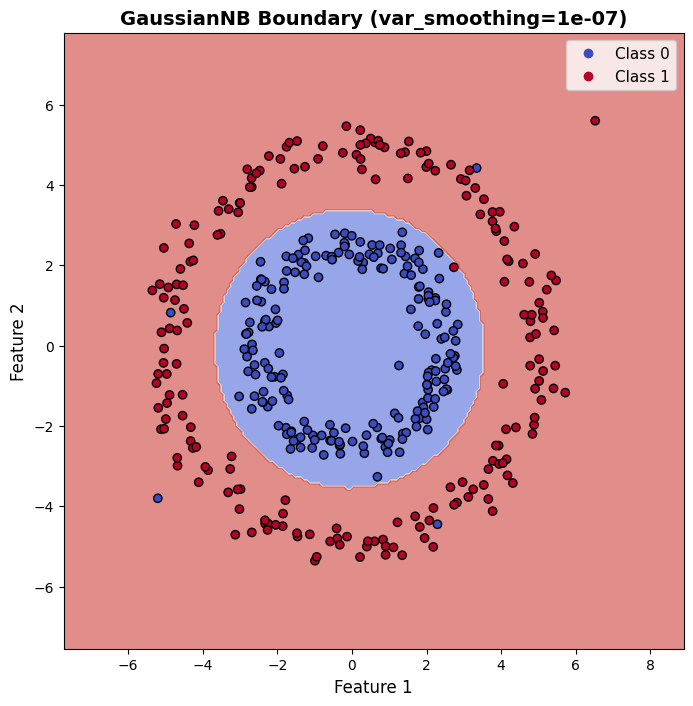


=== GaussianNB(var_smoothing=1e-05) ===
----- 📊 GaussianNB var_smoothing=1e-05 -----
Accuracy: 0.9875
Precision: 0.9802
Recall: 0.9950
F1-Score: 0.9875
------------------------------------------


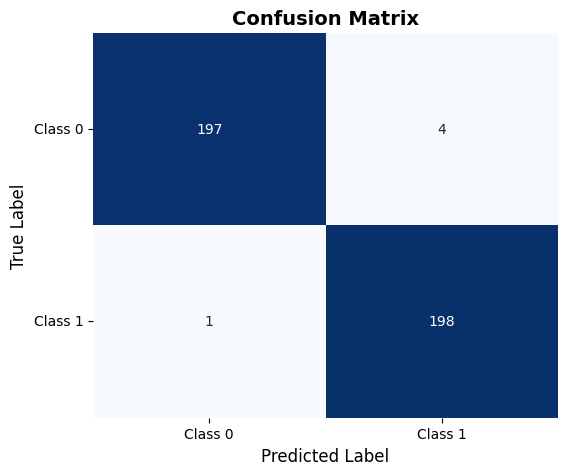

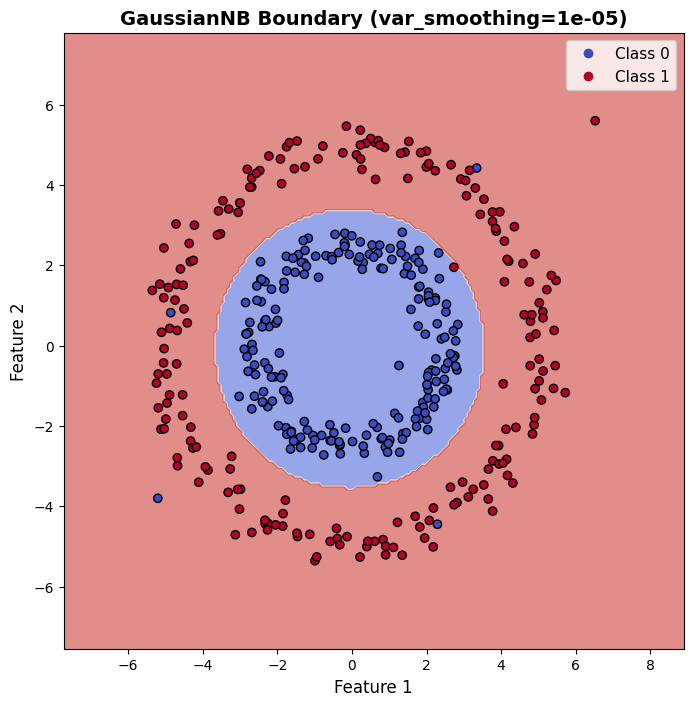


📊 Summary of GaussianNB results:
var_smoothing=1e-10      → Accuracy=0.9875
var_smoothing=1e-09      → Accuracy=0.9875
var_smoothing=1e-07      → Accuracy=0.9875
var_smoothing=1e-05      → Accuracy=0.9875


In [27]:
# === 1.4.1 GaussianNB Experiments ===
from sklearn.naive_bayes import GaussianNB

# Фіксуємо seed
STUDENT_ID = 12

# Генеруємо дані (два кола — класична нелінійна задача)
X_data, y_data = generate_classification_data(
    n_samples=400,
    kernels=[circle_kernel(radius=2.5), circle_kernel(radius=5)],
    kernel_classes=[0, 1],
    dispersion=0.3,
    n_outliers=10,
    random_seed=STUDENT_ID
)

# Список значень для var_smoothing
var_smoothing_values = [1e-10, 1e-9, 1e-7, 1e-5]

results_nb = []

for vs in var_smoothing_values:
    model = GaussianNB(var_smoothing=vs)
    model.fit(X_data, y_data)
    y_pred = model.predict(X_data)
    acc = accuracy_score(y_data, y_pred)
    
    print(f"\n=== GaussianNB(var_smoothing={vs}) ===")
    show_classification_report(X_data, y_data, model, title=f"GaussianNB var_smoothing={vs}")
    plot_classifier_boundary(X_data, y_data, model, title=f"GaussianNB Boundary (var_smoothing={vs})")
    
    results_nb.append((vs, acc))

# Порівняємо результати
print("\n📊 Summary of GaussianNB results:")
for vs, acc in results_nb:
    print(f"var_smoothing={vs:<10} → Accuracy={acc:.4f}")


### 1.4.2. Experiment on `LogisticRegression`

**Hint**: This is a fundamental linear model. Its complexity is controlled by regularization.

1. `C`: The inverse of regularization strength. This is the most critical hyperparameter.
    * _What it does_: It controls the penalty for model complexity. A small `C` creates a strong penalty, forcing the model to be simpler (more regularization). A large `C` creates a weak penalty, allowing the model to be more complex and fit the training data more closely.
    * _What to try_: Use a logarithmic scale, as the effect is not linear. Try values like `0.01`, `0.1`, `1`, `10`, `100`.
    * _Expected effect_: Small C values risk underfitting, while large C values risk overfitting.


2. `penalty`: The type of regularization to use.
    * _What it does_: Determines how the model's weights are penalized. `l2` (the default) is a general-purpose penalty. `l1` can force some feature weights to become exactly zero, effectively performing feature selection.
    * _What to try_: Compare `l2` with `l1`. Note: You may need to change the solver, as not all solvers support the `l1` penalty (e.g., `solver='liblinear'` or `solver='saga'` works with `l1`).


=== LogisticRegression(C=0.01) ===
----- 📊 LogisticRegression C=0.01 -----
Accuracy: 0.9850
(Scores below are averaged using the 'weighted' method for multi-class)
Precision: 0.9850
Recall: 0.9850
F1-Score: 0.9850
-------------------------------------


c:\Users\SystemX\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


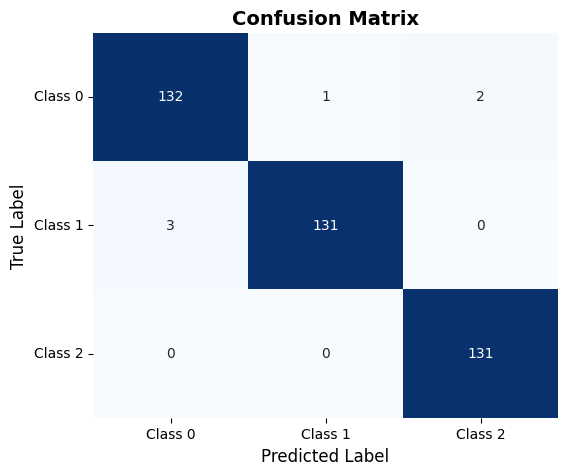

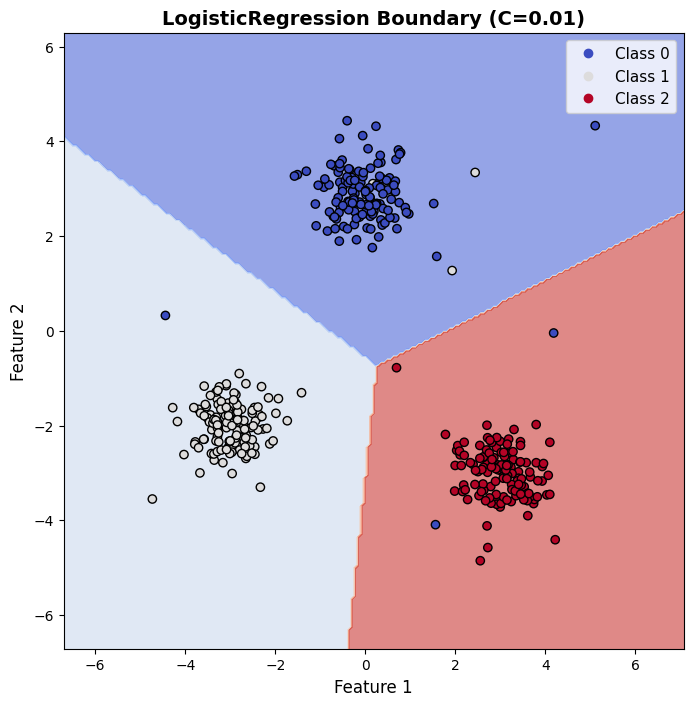


=== LogisticRegression(C=0.1) ===
----- 📊 LogisticRegression C=0.1 -----
Accuracy: 0.9850
(Scores below are averaged using the 'weighted' method for multi-class)
Precision: 0.9850
Recall: 0.9850
F1-Score: 0.9850
------------------------------------


c:\Users\SystemX\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


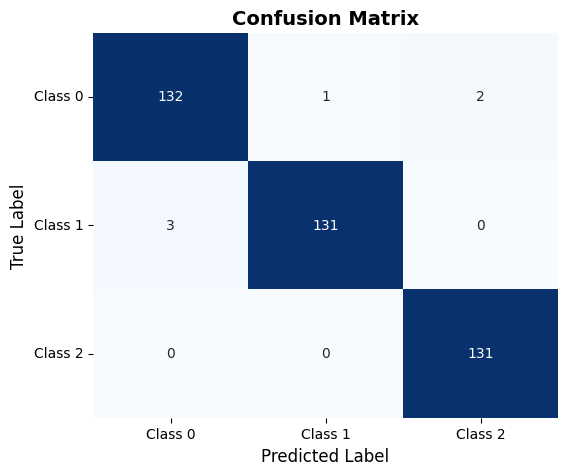

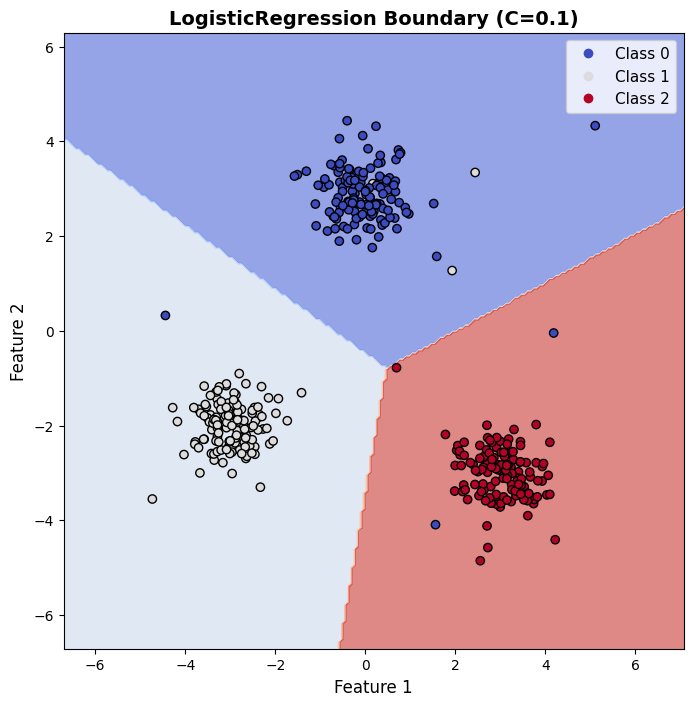

c:\Users\SystemX\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(



=== LogisticRegression(C=1) ===
----- 📊 LogisticRegression C=1 -----
Accuracy: 0.9825
(Scores below are averaged using the 'weighted' method for multi-class)
Precision: 0.9825
Recall: 0.9825
F1-Score: 0.9825
----------------------------------


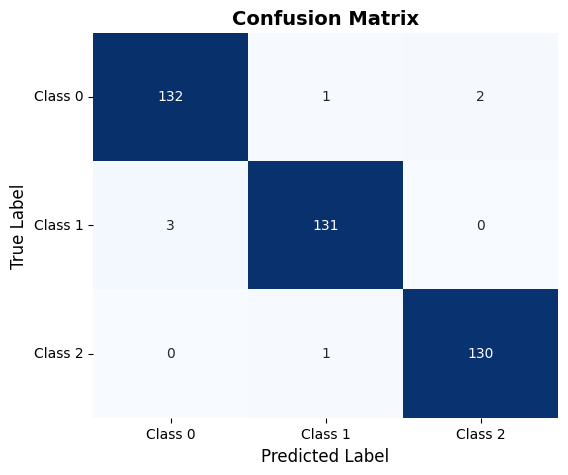

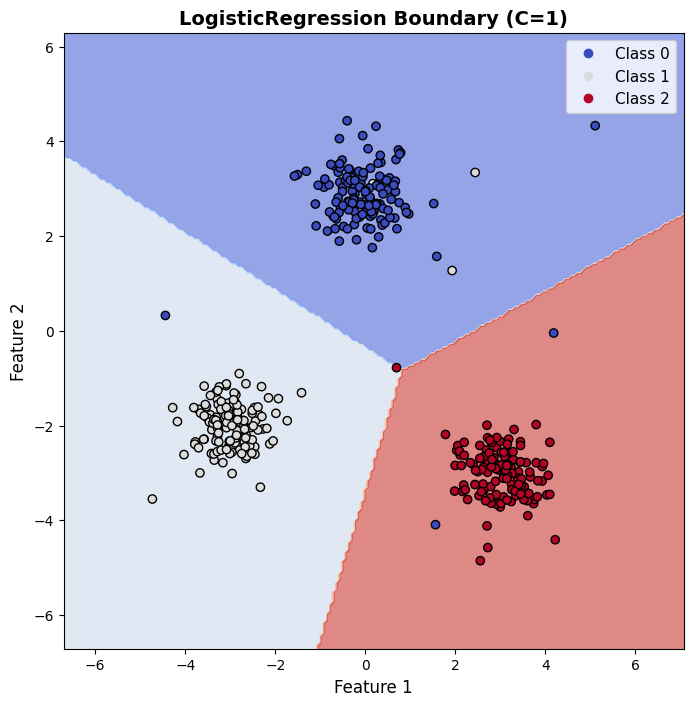


=== LogisticRegression(C=10) ===
----- 📊 LogisticRegression C=10 -----
Accuracy: 0.9825
(Scores below are averaged using the 'weighted' method for multi-class)
Precision: 0.9825
Recall: 0.9825
F1-Score: 0.9825
-----------------------------------


c:\Users\SystemX\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


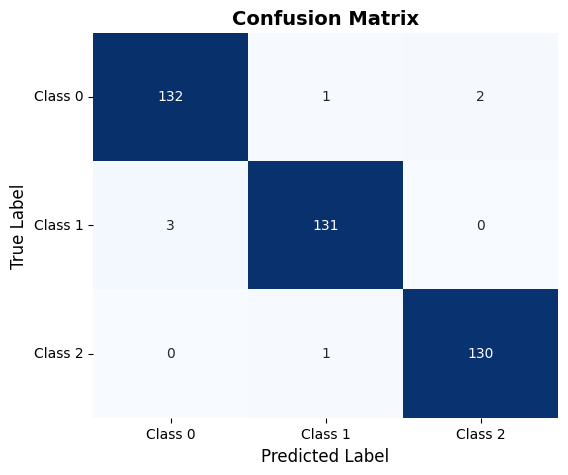

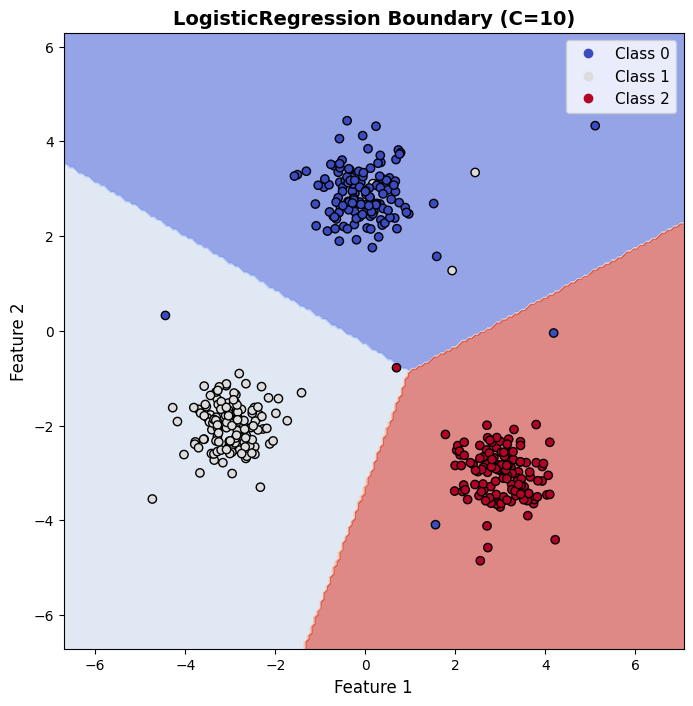

c:\Users\SystemX\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(



=== LogisticRegression(C=100) ===
----- 📊 LogisticRegression C=100 -----
Accuracy: 0.9825
(Scores below are averaged using the 'weighted' method for multi-class)
Precision: 0.9825
Recall: 0.9825
F1-Score: 0.9825
------------------------------------


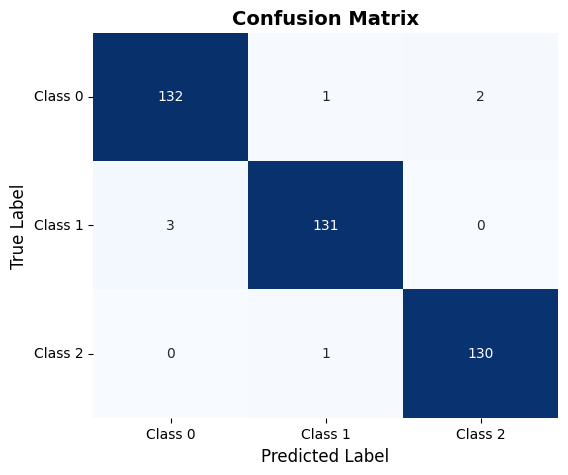

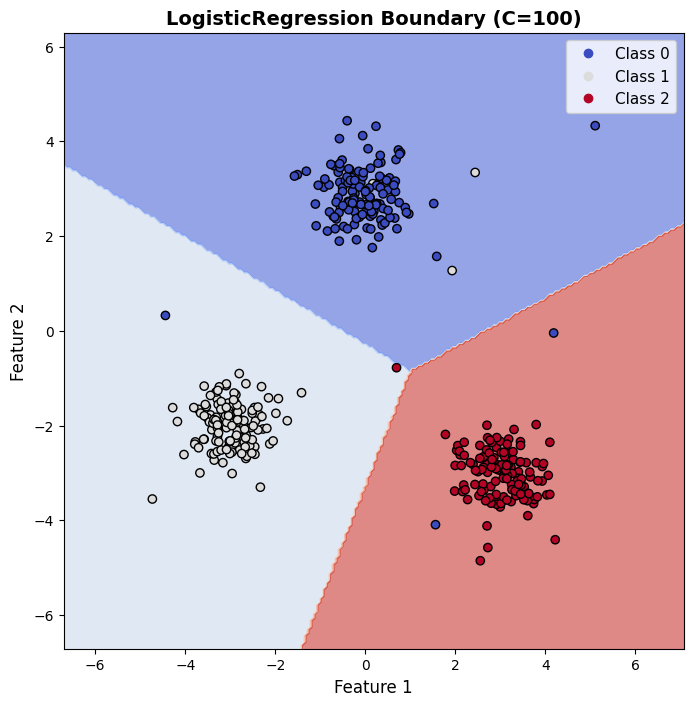

c:\Users\SystemX\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(



=== LogisticRegression(C=1, penalty='l1') ===
----- 📊 LogisticRegression L1 Regularization -----
Accuracy: 0.9850
(Scores below are averaged using the 'weighted' method for multi-class)
Precision: 0.9850
Recall: 0.9850
F1-Score: 0.9850
------------------------------------------------


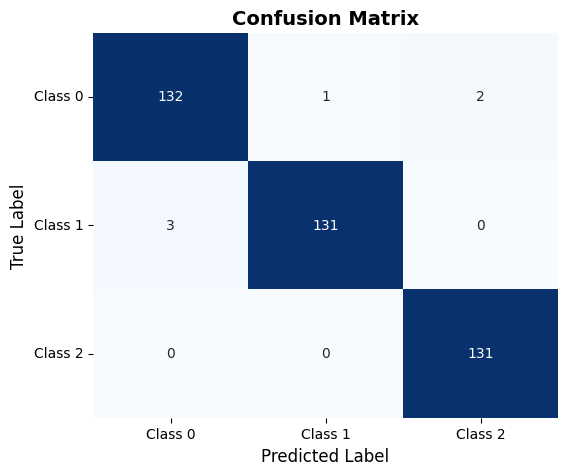

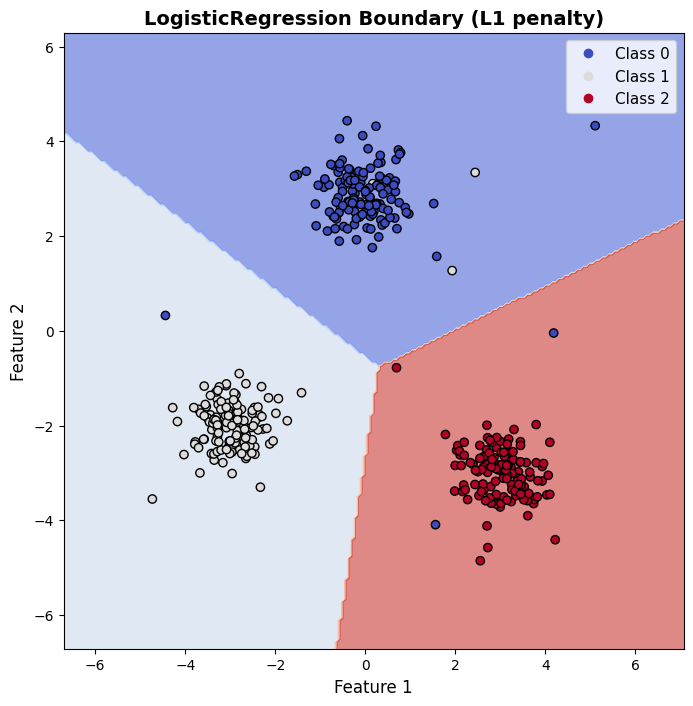


📊 Summary of LogisticRegression results:
C=0.01       → Accuracy=0.9850
C=0.1        → Accuracy=0.9850
C=1          → Accuracy=0.9825
C=10         → Accuracy=0.9825
C=100        → Accuracy=0.9825


In [28]:
# === 1.4.2 LogisticRegression Experiments ===
from sklearn.linear_model import LogisticRegression

STUDENT_ID = 12

# Генеруємо дані — три гаусові кластери
X_data, y_data = generate_classification_data(
    n_samples=400,
    kernels=[
        gaussian_kernel(center=[0, 3]),
        gaussian_kernel(center=[-3, -2]),
        gaussian_kernel(center=[3, -3])
    ],
    kernel_classes=[0, 1, 2],
    dispersion=0.5,
    n_outliers=10,
    random_seed=STUDENT_ID
)

# Тестові значення C (регуляризації)
C_values = [0.01, 0.1, 1, 10, 100]

results_lr = []

for C in C_values:
    model = LogisticRegression(C=C, solver='lbfgs', multi_class='auto', max_iter=1000)
    model.fit(X_data, y_data)
    y_pred = model.predict(X_data)
    acc = accuracy_score(y_data, y_pred)
    
    print(f"\n=== LogisticRegression(C={C}) ===")
    show_classification_report(X_data, y_data, model, title=f"LogisticRegression C={C}")
    plot_classifier_boundary(X_data, y_data, model, title=f"LogisticRegression Boundary (C={C})")
    
    results_lr.append((C, acc))

# Тестуємо вплив penalty='l1'
model_l1 = LogisticRegression(C=1, solver='liblinear', penalty='l1', multi_class='auto')
model_l1.fit(X_data, y_data)
print("\n=== LogisticRegression(C=1, penalty='l1') ===")
show_classification_report(X_data, y_data, model_l1, title="LogisticRegression L1 Regularization")
plot_classifier_boundary(X_data, y_data, model_l1, title="LogisticRegression Boundary (L1 penalty)")

# Підсумкове порівняння
print("\n📊 Summary of LogisticRegression results:")
for C, acc in results_lr:
    print(f"C={C:<10} → Accuracy={acc:.4f}")


### 1.4.3. Experiment on `SVC` (considered independent experiments on each kernel)

**Hint**: SVCs are powerful and their behavior is highly dependent on these three parameters.
1. `C`: The regularization parameter.
   * _What it does_: Controls the trade-off between having a smooth, wide decision boundary (margin) and correctly classifying as many training points as possible. A small `C` allows for a wider margin and more misclassifications. A large `C` pushes for a narrower margin, trying to classify every point correctly.
   * _What to try_: A logarithmic scale: `0.1`, `1`, `10`, `100`.
2. `kernel`: The function used to transform the data.
   * _What it does_: It maps the data into a higher-dimensional space, allowing the model to find non-linear boundaries.
   * _What to try_: `linear` for a straight-line boundary, and `rbf` (Radial Basis Function) for a complex, curved boundary. The `rbf` kernel is the default and usually the most powerful.
3. `gamma`: The kernel coefficient for `rbf`.
   * _What it does_: Defines the "radius of influence" of a single training point. A small gamma means a point has a far-reaching influence, resulting in a smoother, more general boundary. A large gamma means a point has a very local influence, leading to a more complex, wiggly boundary that closely follows the data.
   * _What to try_: A logarithmic scale: `0.001`, `0.01`, `0.1`, `1`. You can also try the default `scale`.


=== SVC(kernel='rbf', C=0.1) ===
----- 📊 SVC RBF C=0.1 -----
Accuracy: 0.5875
Precision: 0.6466
Recall: 0.3769
F1-Score: 0.4762
-------------------------


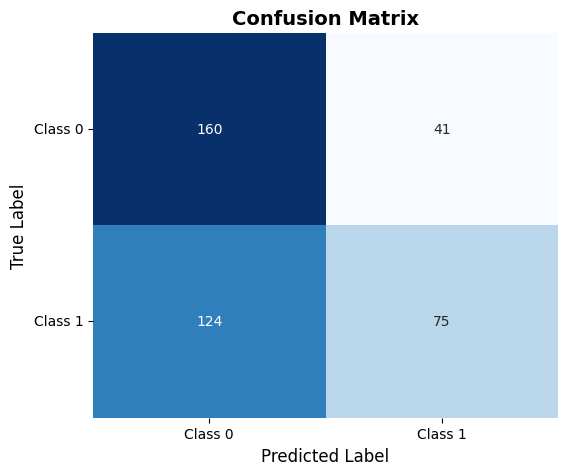

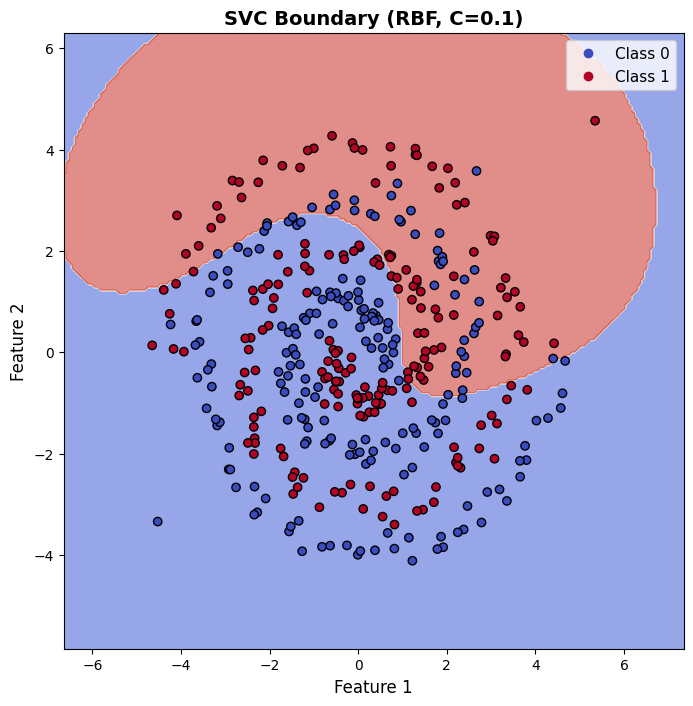


=== SVC(kernel='rbf', C=1) ===
----- 📊 SVC RBF C=1 -----
Accuracy: 0.5975
Precision: 0.5960
Recall: 0.5930
F1-Score: 0.5945
-----------------------


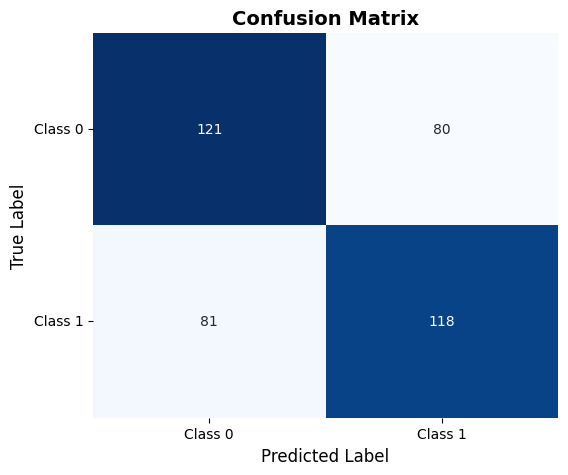

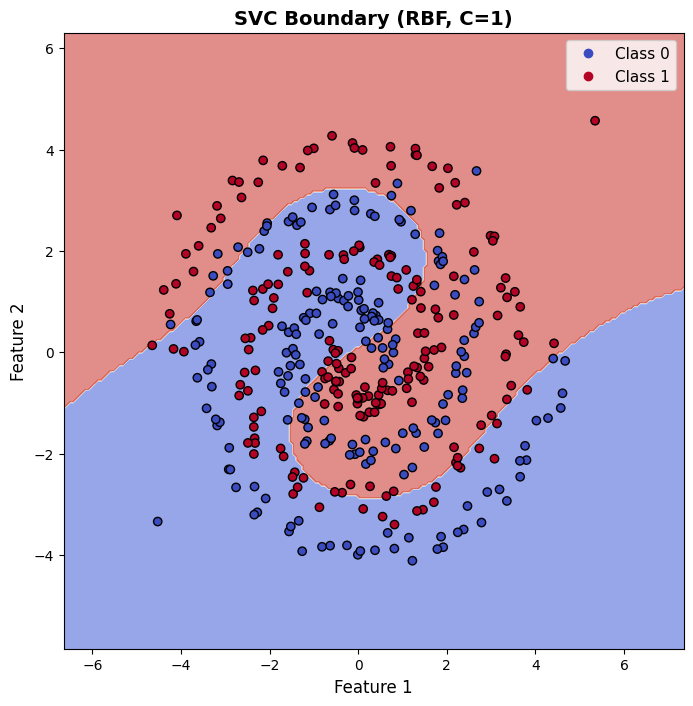


=== SVC(kernel='rbf', C=10) ===
----- 📊 SVC RBF C=10 -----
Accuracy: 0.6825
Precision: 0.6698
Recall: 0.7136
F1-Score: 0.6910
------------------------


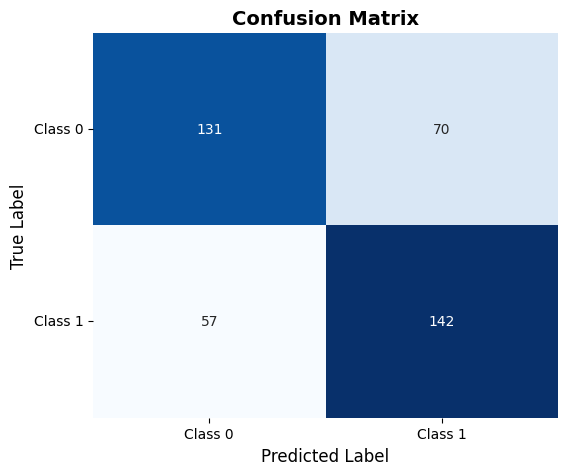

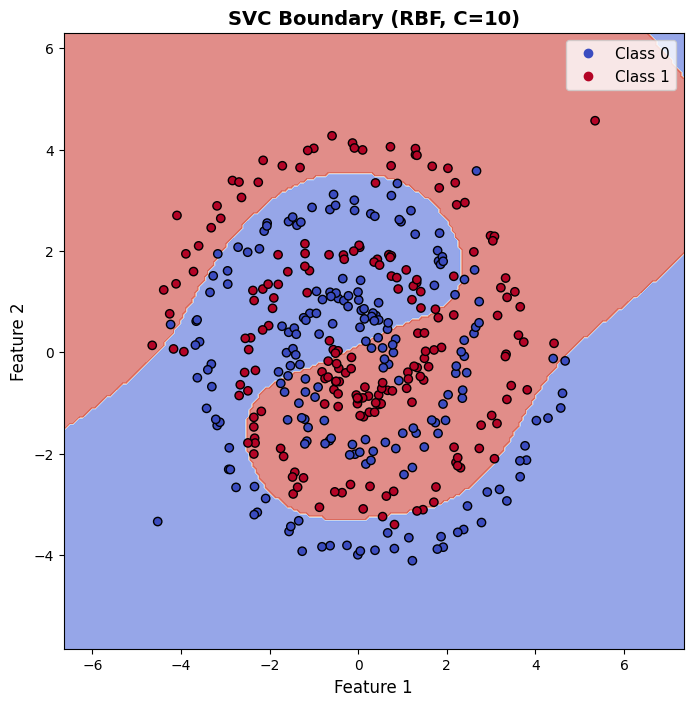


=== SVC(kernel='rbf', C=100) ===
----- 📊 SVC RBF C=100 -----
Accuracy: 0.7500
Precision: 0.7676
Recall: 0.7136
F1-Score: 0.7396
-------------------------


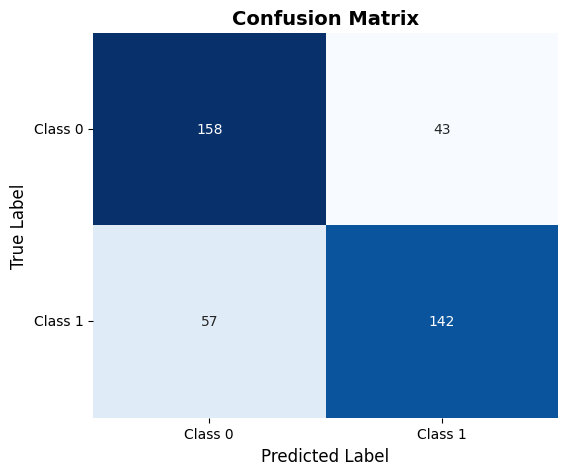

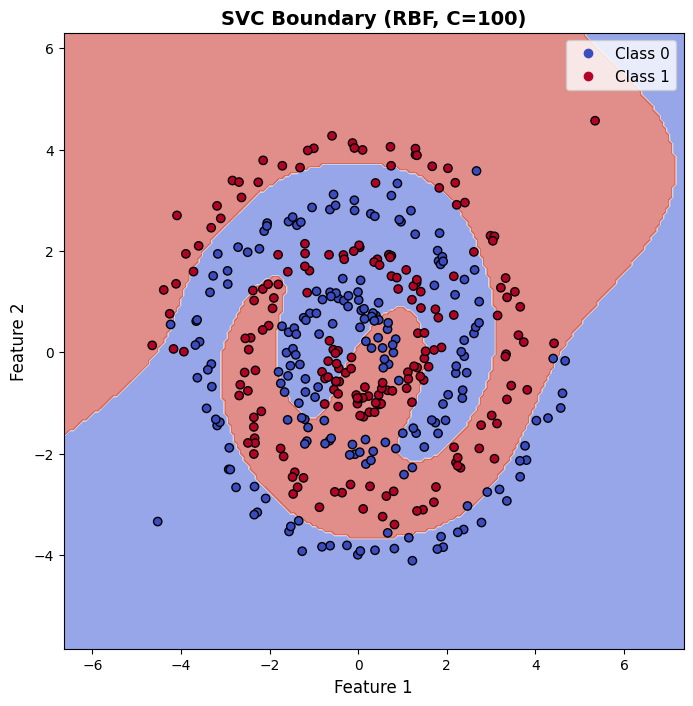


📊 Summary (Effect of C):
C=0.1        → Accuracy=0.5875
C=1          → Accuracy=0.5975
C=10         → Accuracy=0.6825
C=100        → Accuracy=0.7500


In [29]:
# === 1.4.3 SVC Experiment: Effect of C ===
from sklearn.svm import SVC

STUDENT_ID = 12

# Генеруємо нелінійні дані (дві спіралі)
X_data, y_data = generate_classification_data(
    n_samples=400,
    kernels=[
        spiral_kernel(rotations=2, start_radius=0.5),
        lambda n: -1 * spiral_kernel(rotations=2, start_radius=0.5)(n)
    ],
    kernel_classes=[0, 1],
    dispersion=0.2,
    n_outliers=10,
    random_seed=STUDENT_ID
)

# Перевіримо різні значення C
C_values = [0.1, 1, 10, 100]
results_svc_C = []

for C in C_values:
    model = SVC(kernel='rbf', C=C, gamma='scale')
    model.fit(X_data, y_data)
    y_pred = model.predict(X_data)
    acc = accuracy_score(y_data, y_pred)

    print(f"\n=== SVC(kernel='rbf', C={C}) ===")
    show_classification_report(X_data, y_data, model, title=f"SVC RBF C={C}")
    plot_classifier_boundary(X_data, y_data, model, title=f"SVC Boundary (RBF, C={C})")

    results_svc_C.append((C, acc))

print("\n📊 Summary (Effect of C):")
for C, acc in results_svc_C:
    print(f"C={C:<10} → Accuracy={acc:.4f}")



=== SVC(kernel='linear') ===
----- 📊 SVC kernel=linear -----
Accuracy: 0.5150
Precision: 0.5130
Recall: 0.4975
F1-Score: 0.5051
-----------------------------


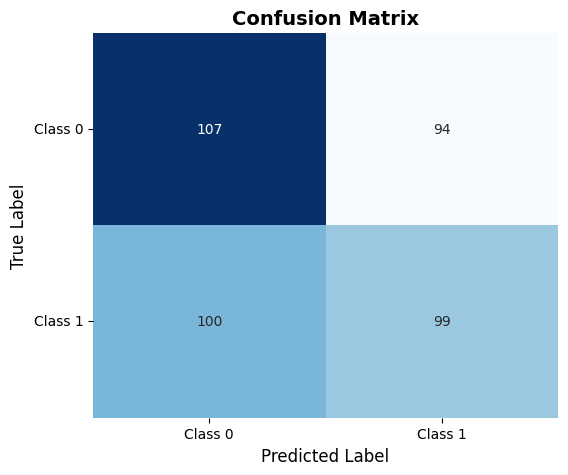

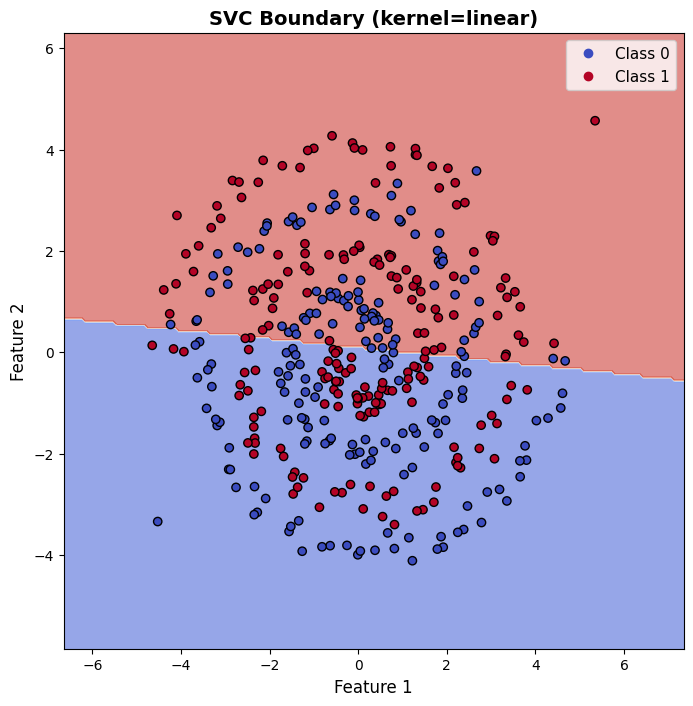


=== SVC(kernel='rbf') ===
----- 📊 SVC kernel=rbf -----
Accuracy: 0.6825
Precision: 0.6698
Recall: 0.7136
F1-Score: 0.6910
--------------------------


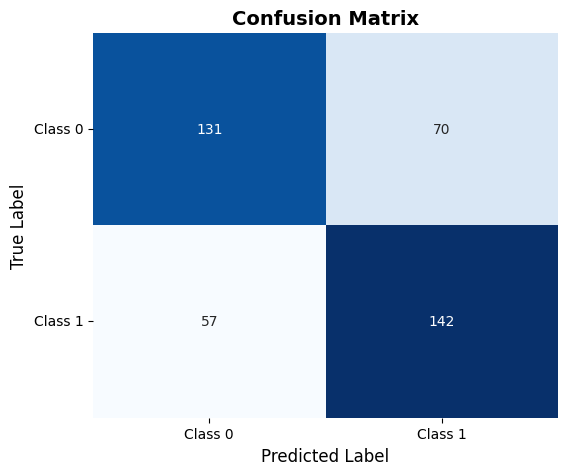

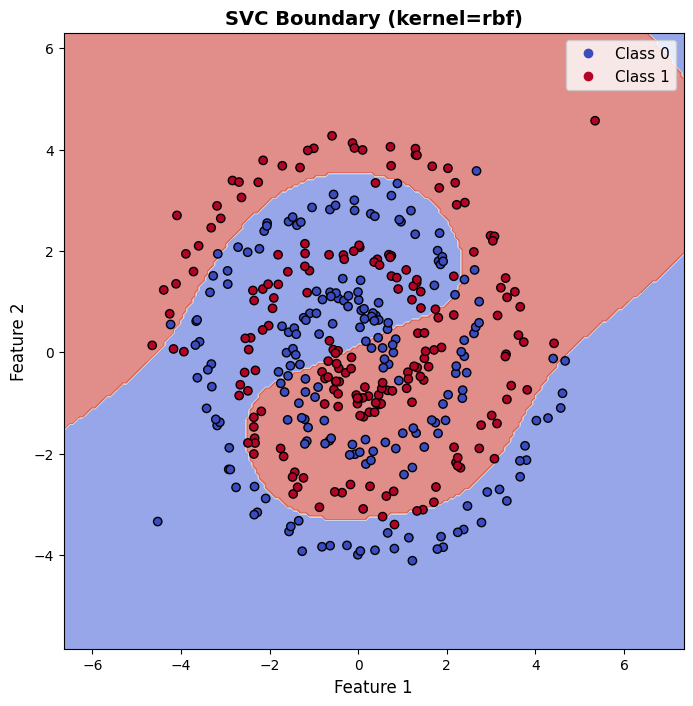


📊 Summary (Linear vs RBF):
kernel=linear  → Accuracy=0.5150
kernel=rbf     → Accuracy=0.6825


In [30]:
# === 1.4.3 SVC Experiment: Linear vs RBF kernels ===
kernels = ['linear', 'rbf']
results_svc_kernels = []

for k in kernels:
    model = SVC(kernel=k, C=10, gamma='scale')
    model.fit(X_data, y_data)
    y_pred = model.predict(X_data)
    acc = accuracy_score(y_data, y_pred)

    print(f"\n=== SVC(kernel='{k}') ===")
    show_classification_report(X_data, y_data, model, title=f"SVC kernel={k}")
    plot_classifier_boundary(X_data, y_data, model, title=f"SVC Boundary (kernel={k})")

    results_svc_kernels.append((k, acc))

print("\n📊 Summary (Linear vs RBF):")
for k, acc in results_svc_kernels:
    print(f"kernel={k:<7} → Accuracy={acc:.4f}")



=== SVC(kernel='rbf', gamma=0.001) ===
----- 📊 SVC RBF gamma=0.001 -----
Accuracy: 0.5125
Precision: 0.5103
Recall: 0.4975
F1-Score: 0.5038
-------------------------------


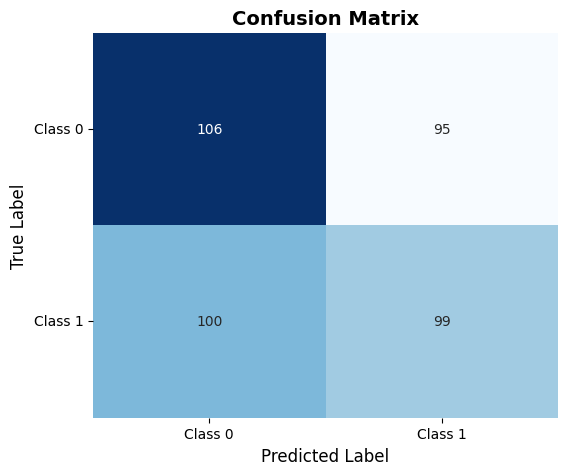

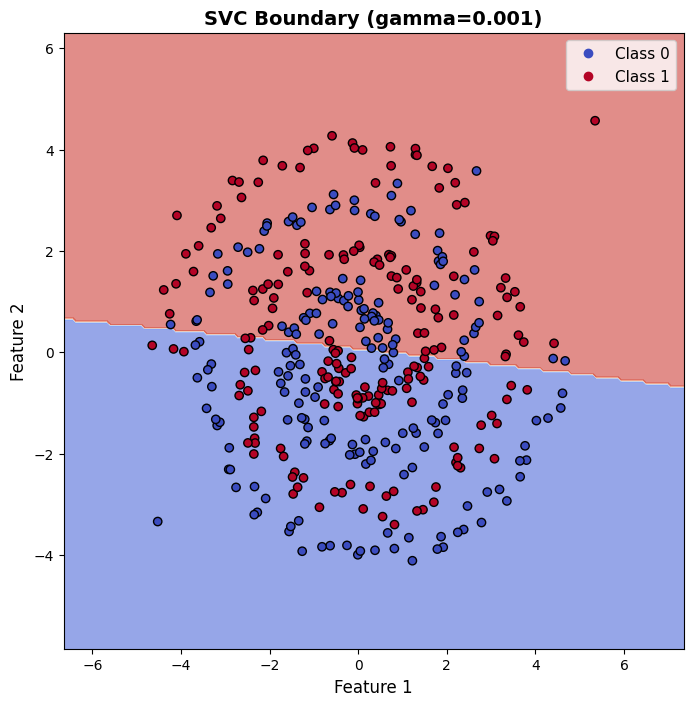


=== SVC(kernel='rbf', gamma=0.01) ===
----- 📊 SVC RBF gamma=0.01 -----
Accuracy: 0.5800
Precision: 0.6183
Recall: 0.4070
F1-Score: 0.4909
------------------------------


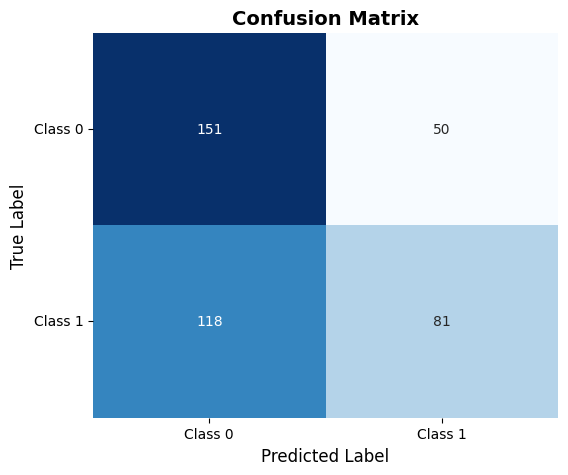

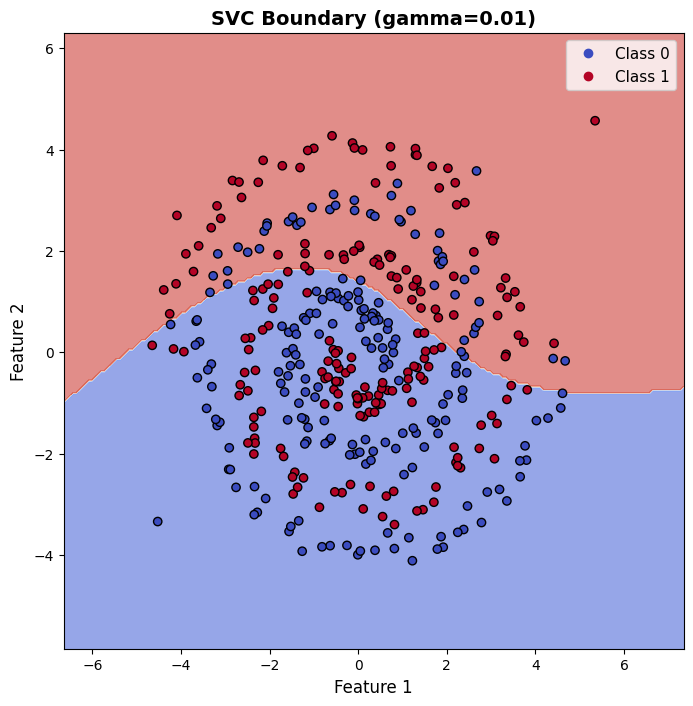


=== SVC(kernel='rbf', gamma=0.1) ===
----- 📊 SVC RBF gamma=0.1 -----
Accuracy: 0.6875
Precision: 0.6779
Recall: 0.7085
F1-Score: 0.6929
-----------------------------


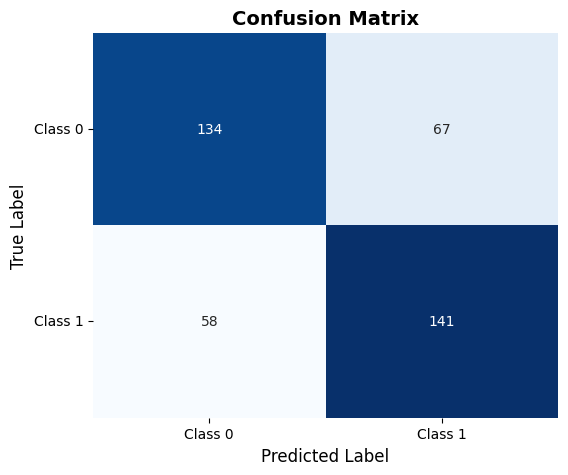

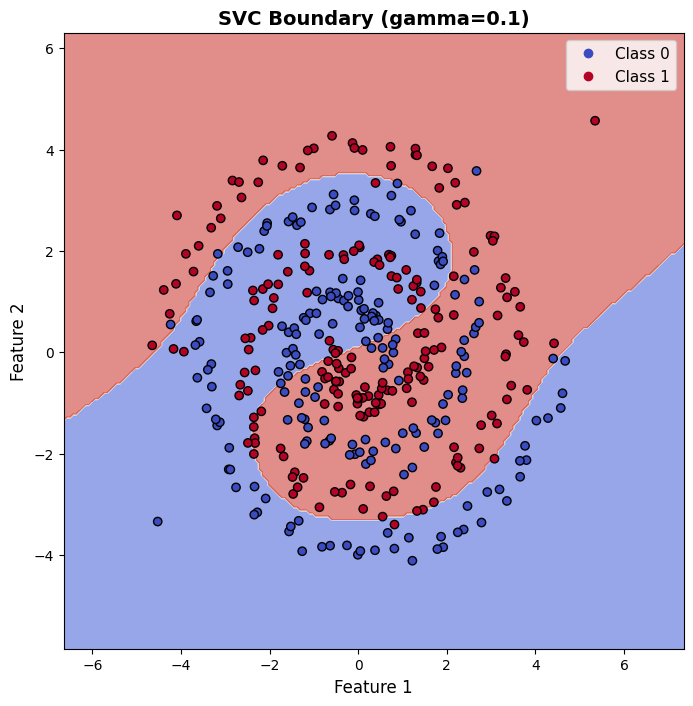


=== SVC(kernel='rbf', gamma=1) ===
----- 📊 SVC RBF gamma=1 -----
Accuracy: 0.9825
Precision: 0.9848
Recall: 0.9799
F1-Score: 0.9824
---------------------------


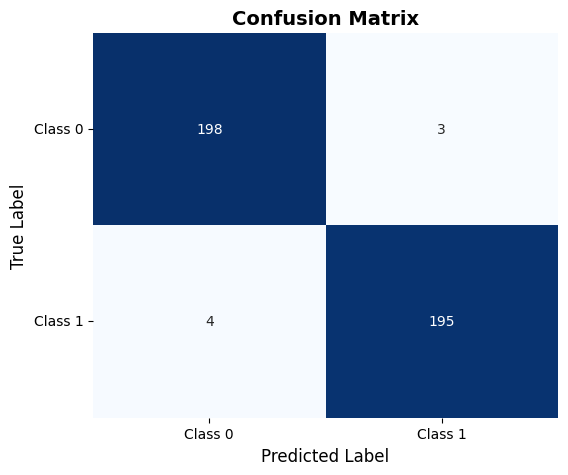

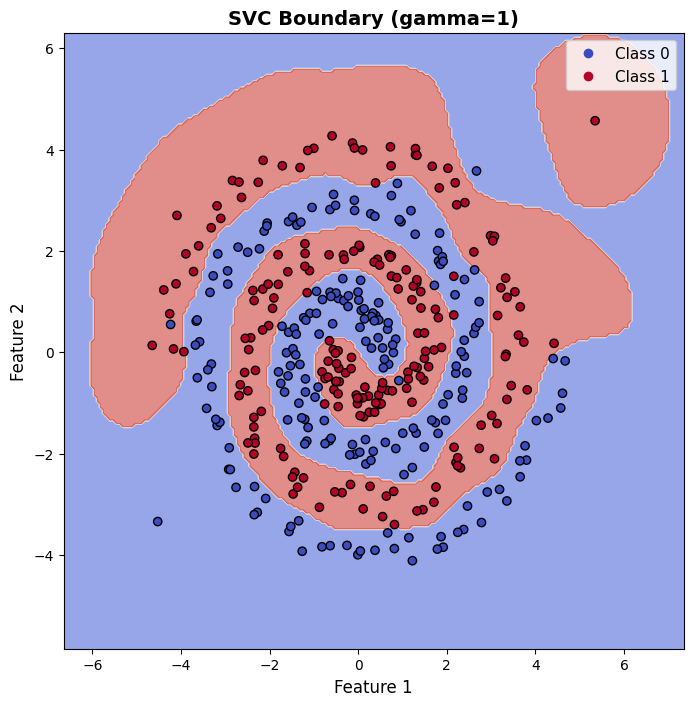


📊 Summary (Effect of gamma):
gamma=0.001    → Accuracy=0.5125
gamma=0.01     → Accuracy=0.5800
gamma=0.1      → Accuracy=0.6875
gamma=1        → Accuracy=0.9825


In [31]:
# === 1.4.3. SVC Experiment: Effect of gamma ===
gamma_values = [0.001, 0.01, 0.1, 1]
results_svc_gamma = []

for g in gamma_values:
    model = SVC(kernel='rbf', C=10, gamma=g)
    model.fit(X_data, y_data)
    y_pred = model.predict(X_data)
    acc = accuracy_score(y_data, y_pred)

    print(f"\n=== SVC(kernel='rbf', gamma={g}) ===")
    show_classification_report(X_data, y_data, model, title=f"SVC RBF gamma={g}")
    plot_classifier_boundary(X_data, y_data, model, title=f"SVC Boundary (gamma={g})")

    results_svc_gamma.append((g, acc))

print("\n📊 Summary (Effect of gamma):")
for g, acc in results_svc_gamma:
    print(f"gamma={g:<8} → Accuracy={acc:.4f}")


### 1.4.4. Experiment on `DecisionTreeClassifier`

**Hint**: The key is to control the tree's growth to prevent overfitting.
1. `max_depth`: The maximum number of levels in the tree.
    * _What it does_: This is the most direct way to control model complexity. A shallow tree is simple; a deep tree is complex.
    * _What to try_: Integers like `3`, `5`, `10`, or `None` (which lets the tree grow until all leaves are pure).
    * _Expected effect_: A small max_depth will likely underfit. A very large or None max_depth will almost certainly overfit the training data.

2. `min_samples_leaf`: The minimum number of samples required to be at a leaf node.
    * _What it does_: Prevents the tree from creating leaves for very small, specific groups of data points. Think of it as a rule saying, "don't make a final decision based on just one or two examples."
    * _What to try_: Integers like `1` (the default), `5`, `10`, `20`.
    * _Expected effect_: Increasing this value makes the model more conservative and less prone to overfitting on noise.


=== DecisionTreeClassifier(max_depth=3) ===
----- 📊 DecisionTree max_depth=3 -----
Accuracy: 0.8950
Precision: 0.9816
Recall: 0.8040
F1-Score: 0.8840
------------------------------------


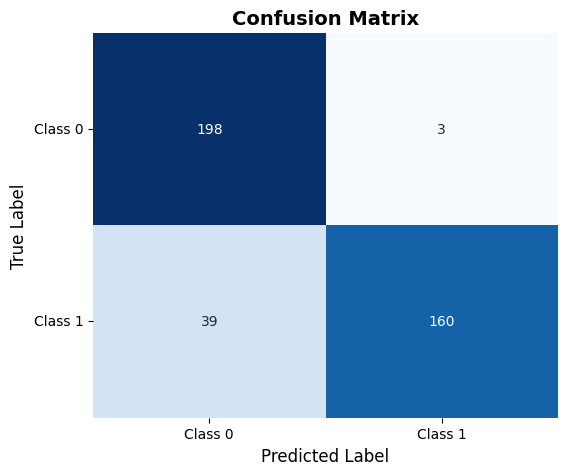

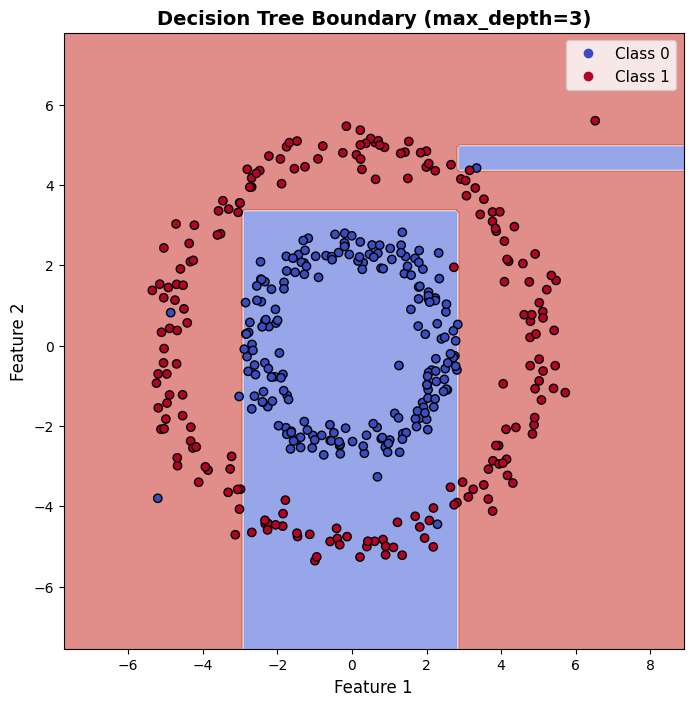


=== DecisionTreeClassifier(max_depth=5) ===
----- 📊 DecisionTree max_depth=5 -----
Accuracy: 0.9925
Precision: 0.9900
Recall: 0.9950
F1-Score: 0.9925
------------------------------------


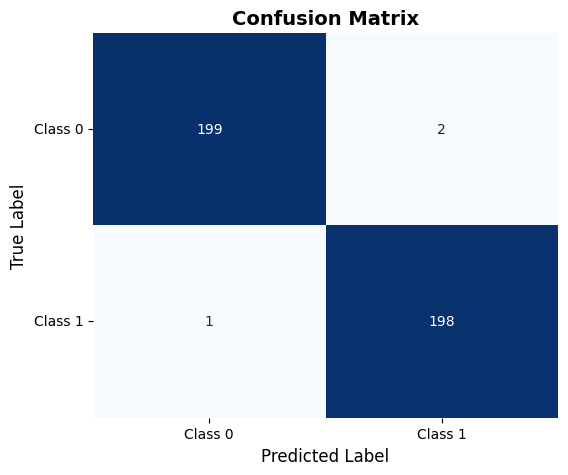

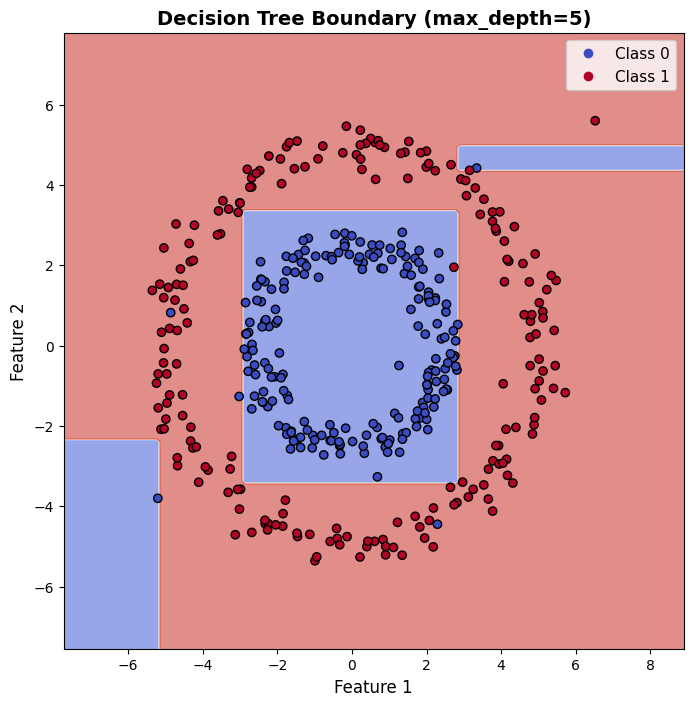


=== DecisionTreeClassifier(max_depth=10) ===
----- 📊 DecisionTree max_depth=10 -----
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1-Score: 1.0000
-------------------------------------


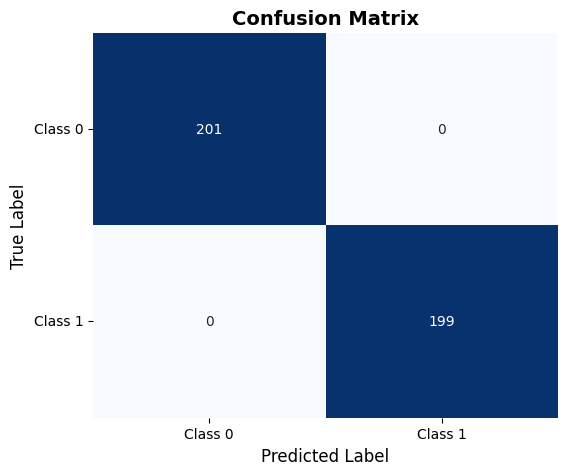

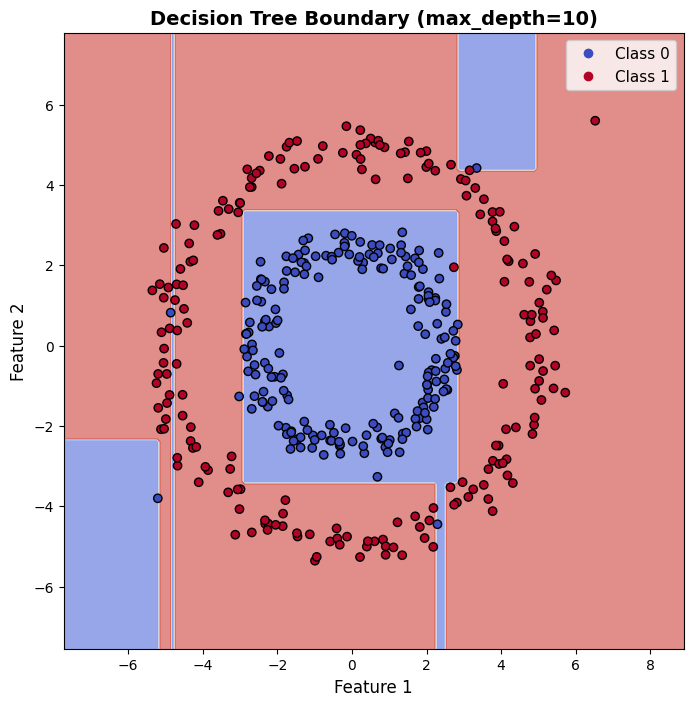


=== DecisionTreeClassifier(max_depth=None) ===
----- 📊 DecisionTree max_depth=None -----
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1-Score: 1.0000
---------------------------------------


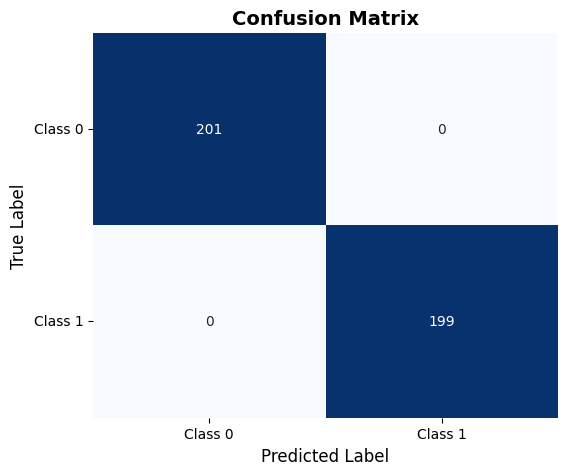

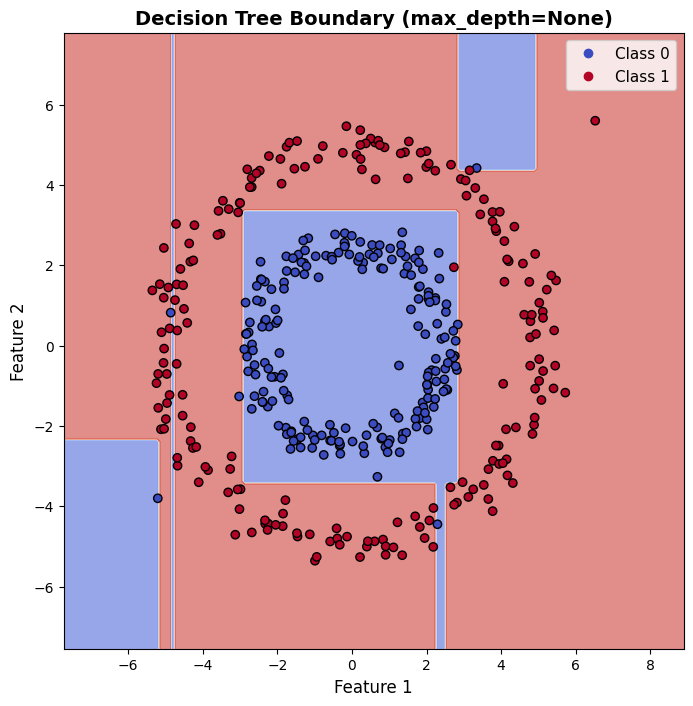


📊 Summary (Effect of max_depth):
max_depth=3        → Accuracy=0.8950
max_depth=5        → Accuracy=0.9925
max_depth=10       → Accuracy=1.0000
max_depth=None     → Accuracy=1.0000


In [32]:
# === 1.4.4.1 DecisionTreeClassifier Experiment: Effect of max_depth ===
from sklearn.tree import DecisionTreeClassifier

STUDENT_ID = 12

# Генеруємо дані (2 кола для візуалізації нелінійних меж)
X_data, y_data = generate_classification_data(
    n_samples=400,
    kernels=[circle_kernel(radius=2.5), circle_kernel(radius=5)],
    kernel_classes=[0, 1],
    dispersion=0.3,
    n_outliers=10,
    random_seed=STUDENT_ID
)

# Тестові значення max_depth
max_depth_values = [3, 5, 10, None]
results_dt_depth = []

for depth in max_depth_values:
    model = DecisionTreeClassifier(max_depth=depth, random_state=STUDENT_ID)
    model.fit(X_data, y_data)
    y_pred = model.predict(X_data)
    acc = accuracy_score(y_data, y_pred)
    
    print(f"\n=== DecisionTreeClassifier(max_depth={depth}) ===")
    show_classification_report(X_data, y_data, model, title=f"DecisionTree max_depth={depth}")
    plot_classifier_boundary(X_data, y_data, model, title=f"Decision Tree Boundary (max_depth={depth})")
    
    results_dt_depth.append((depth, acc))

print("\n📊 Summary (Effect of max_depth):")
for depth, acc in results_dt_depth:
    print(f"max_depth={str(depth):<8} → Accuracy={acc:.4f}")



=== DecisionTreeClassifier(min_samples_leaf=1) ===
----- 📊 DecisionTree min_samples_leaf=1 -----
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1-Score: 1.0000
-------------------------------------------


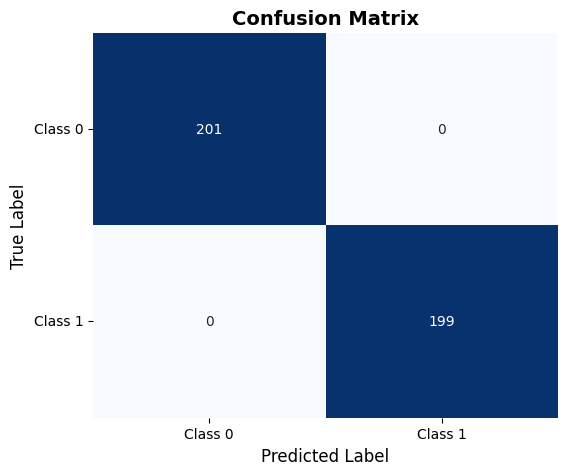

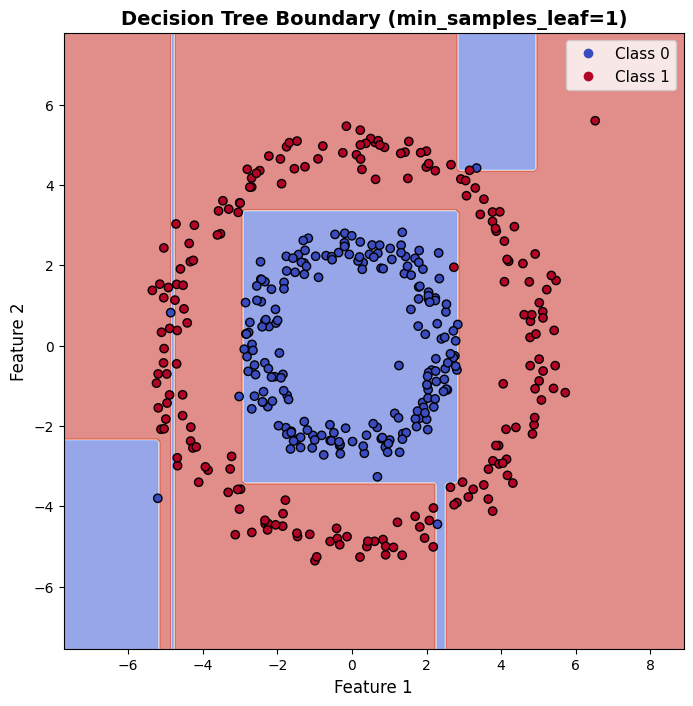


=== DecisionTreeClassifier(min_samples_leaf=5) ===
----- 📊 DecisionTree min_samples_leaf=5 -----
Accuracy: 0.9850
Precision: 0.9754
Recall: 0.9950
F1-Score: 0.9851
-------------------------------------------


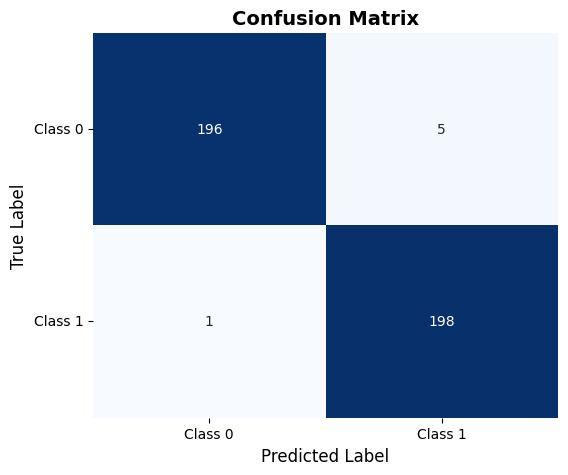

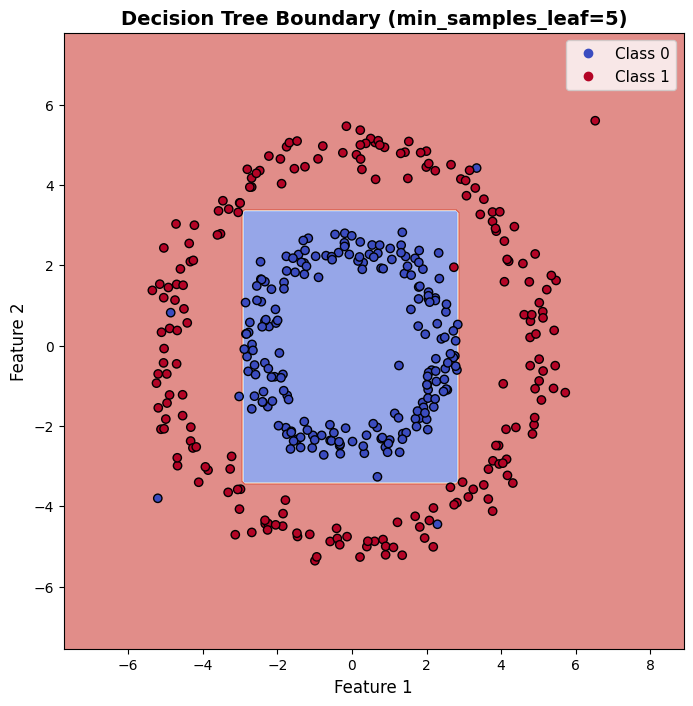


=== DecisionTreeClassifier(min_samples_leaf=10) ===
----- 📊 DecisionTree min_samples_leaf=10 -----
Accuracy: 0.9850
Precision: 0.9754
Recall: 0.9950
F1-Score: 0.9851
--------------------------------------------


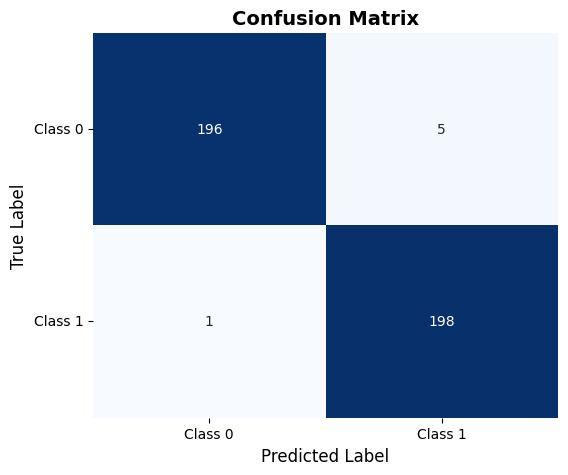

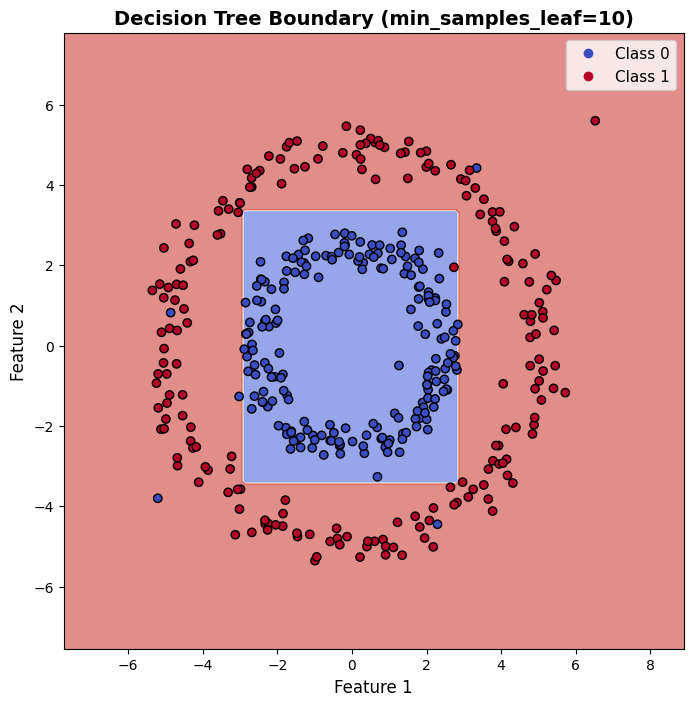


=== DecisionTreeClassifier(min_samples_leaf=20) ===
----- 📊 DecisionTree min_samples_leaf=20 -----
Accuracy: 0.9850
Precision: 0.9754
Recall: 0.9950
F1-Score: 0.9851
--------------------------------------------


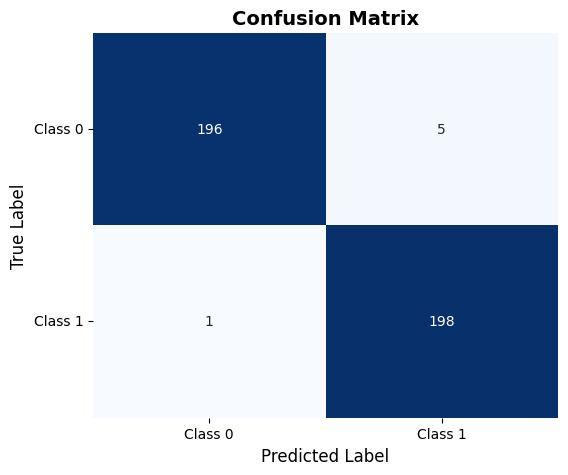

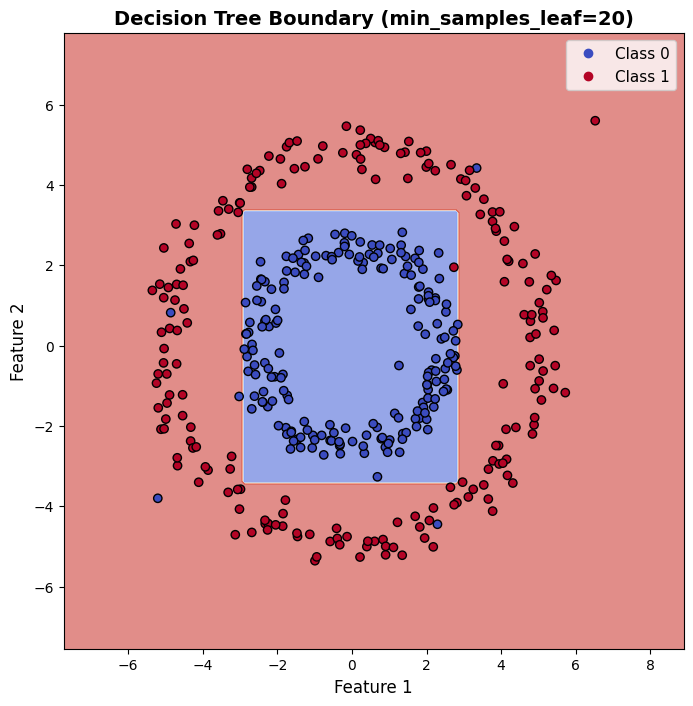


📊 Summary (Effect of min_samples_leaf):
min_samples_leaf=1    → Accuracy=1.0000
min_samples_leaf=5    → Accuracy=0.9850
min_samples_leaf=10   → Accuracy=0.9850
min_samples_leaf=20   → Accuracy=0.9850


In [33]:
# === 1.4.4 DecisionTreeClassifier Experiment: Effect of min_samples_leaf ===
min_samples_leaf_values = [1, 5, 10, 20]
results_dt_leaf = []

for m in min_samples_leaf_values:
    model = DecisionTreeClassifier(min_samples_leaf=m, random_state=STUDENT_ID)
    model.fit(X_data, y_data)
    y_pred = model.predict(X_data)
    acc = accuracy_score(y_data, y_pred)
    
    print(f"\n=== DecisionTreeClassifier(min_samples_leaf={m}) ===")
    show_classification_report(X_data, y_data, model, title=f"DecisionTree min_samples_leaf={m}")
    plot_classifier_boundary(X_data, y_data, model, title=f"Decision Tree Boundary (min_samples_leaf={m})")
    
    results_dt_leaf.append((m, acc))

print("\n📊 Summary (Effect of min_samples_leaf):")
for m, acc in results_dt_leaf:
    print(f"min_samples_leaf={m:<4} → Accuracy={acc:.4f}")


### 1.4.5. Experiment on `RandomForestClassifier`

**Hint**: A Random Forest is an ensemble of many Decision Trees, so you tune both the forest and the trees within it.
1. `n_estimators`: The number of trees in the forest.
    * _What it does_: Controls the size of the ensemble.
    * _What to try_: Integers like `10`, `50`, `100`, `200`.
    * _Expected effect_: More trees generally improve performance and stability, though with diminishing returns. Unlike many other parameters, a higher `n_estimators` doesn't usually cause overfitting, it just increases compute time.

2. `max_depth`: The maximum depth of each individual tree.
    * _What it does_: Controls the complexity of each tree in the forest.
    * _What to try_: `5`, `10`, `20`, or `None`.
    * _Expected effect_: Because a Random Forest averages the results of many trees, it's more robust to deep, overfit individual trees than a single `DecisionTreeClassifier`. However, limiting the depth can still be an effective way to regularize the model.


=== RandomForestClassifier(n_estimators=10) ===
----- 📊 RandomForest n_estimators=10 -----
Accuracy: 0.9975
Precision: 1.0000
Recall: 0.9950
F1-Score: 0.9975
----------------------------------------


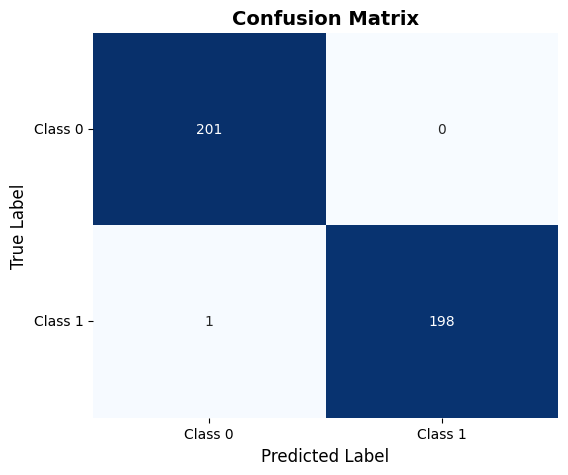

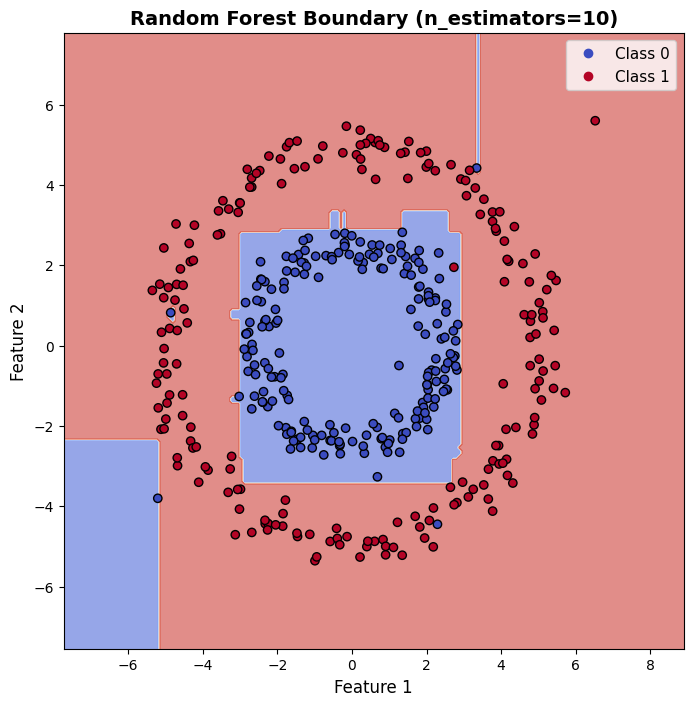


=== RandomForestClassifier(n_estimators=50) ===
----- 📊 RandomForest n_estimators=50 -----
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1-Score: 1.0000
----------------------------------------


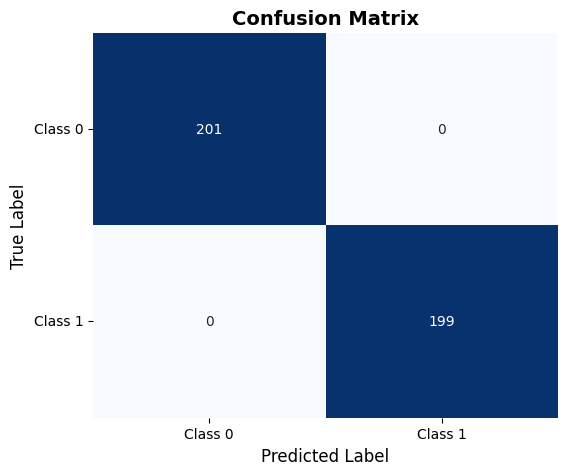

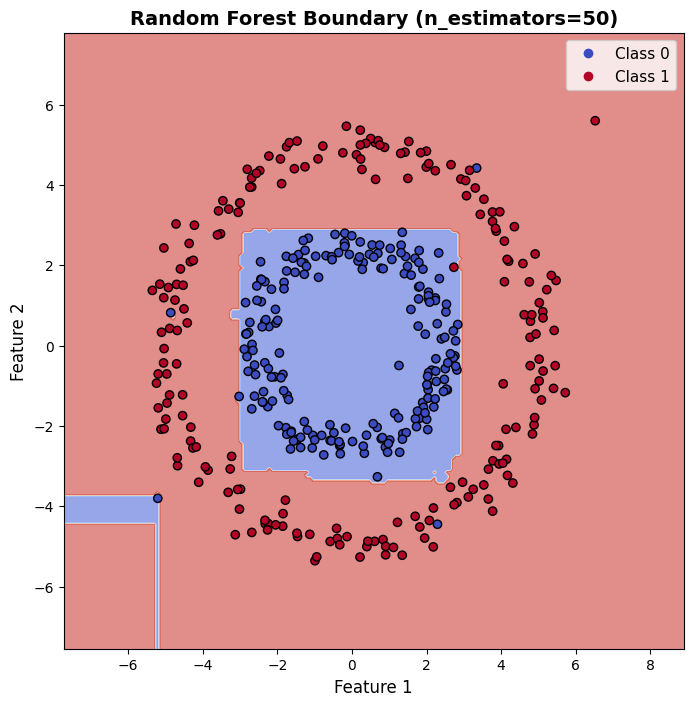


=== RandomForestClassifier(n_estimators=100) ===
----- 📊 RandomForest n_estimators=100 -----
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1-Score: 1.0000
-----------------------------------------


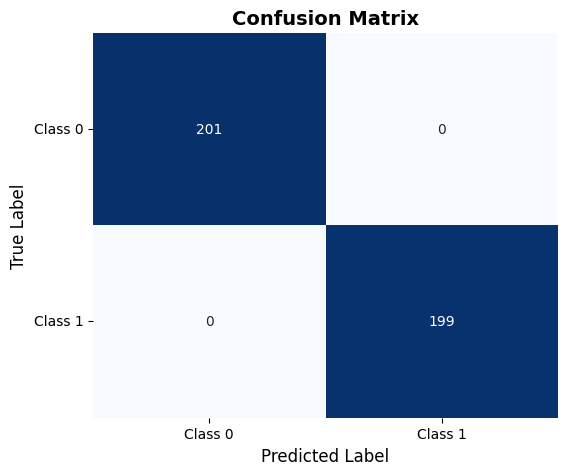

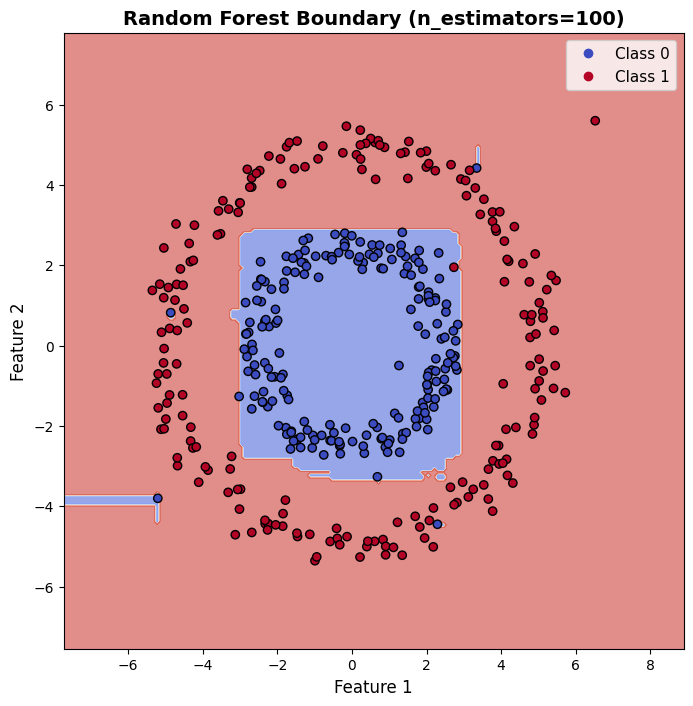


=== RandomForestClassifier(n_estimators=200) ===
----- 📊 RandomForest n_estimators=200 -----
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1-Score: 1.0000
-----------------------------------------


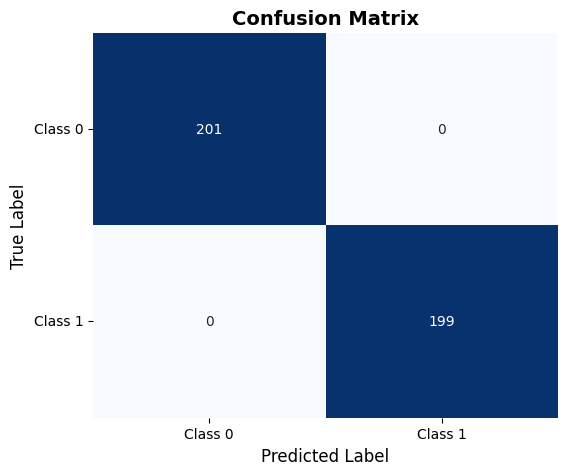

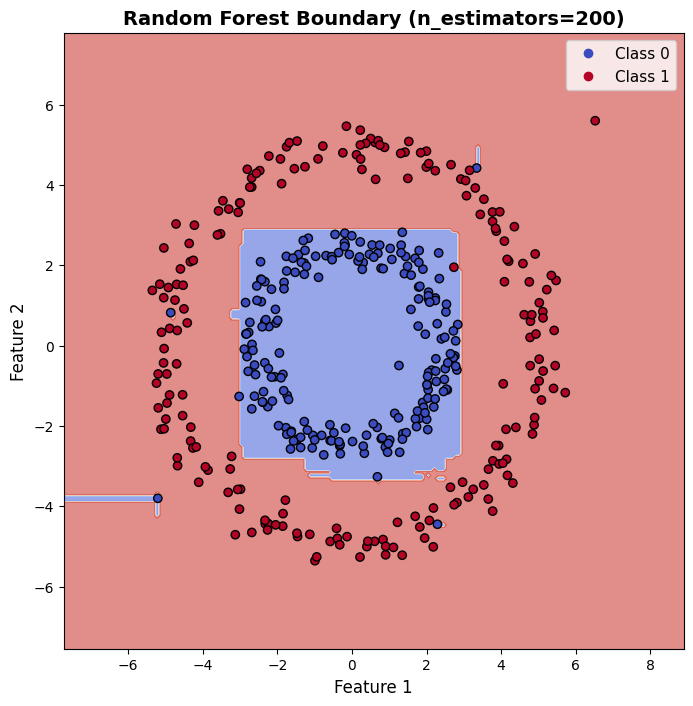


📊 Summary (Effect of n_estimators):
n_estimators=10   → Accuracy=0.9975
n_estimators=50   → Accuracy=1.0000
n_estimators=100  → Accuracy=1.0000
n_estimators=200  → Accuracy=1.0000


In [34]:
# === 1.4.5 RandomForestClassifier Experiment: Effect of n_estimators ===
from sklearn.ensemble import RandomForestClassifier

STUDENT_ID = 12

# Генеруємо дані (два кола — добре видно межі класифікації)
X_data, y_data = generate_classification_data(
    n_samples=400,
    kernels=[circle_kernel(radius=2.5), circle_kernel(radius=5)],
    kernel_classes=[0, 1],
    dispersion=0.3,
    n_outliers=10,
    random_seed=STUDENT_ID
)

# Кількість дерев у лісі
n_estimators_values = [10, 50, 100, 200]
results_rf_n = []

for n in n_estimators_values:
    model = RandomForestClassifier(n_estimators=n, random_state=STUDENT_ID)
    model.fit(X_data, y_data)
    y_pred = model.predict(X_data)
    acc = accuracy_score(y_data, y_pred)
    
    print(f"\n=== RandomForestClassifier(n_estimators={n}) ===")
    show_classification_report(X_data, y_data, model, title=f"RandomForest n_estimators={n}")
    plot_classifier_boundary(X_data, y_data, model, title=f"Random Forest Boundary (n_estimators={n})")
    
    results_rf_n.append((n, acc))

print("\n📊 Summary (Effect of n_estimators):")
for n, acc in results_rf_n:
    print(f"n_estimators={n:<4} → Accuracy={acc:.4f}")


=== RandomForestClassifier(max_depth=5) ===
----- 📊 RandomForest max_depth=5 -----
Accuracy: 0.9925
Precision: 0.9900
Recall: 0.9950
F1-Score: 0.9925
------------------------------------


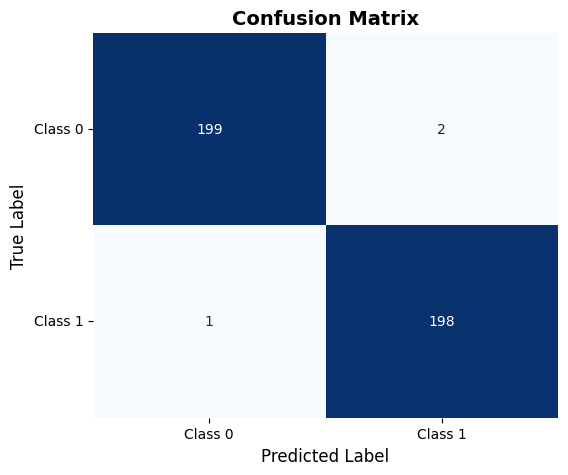

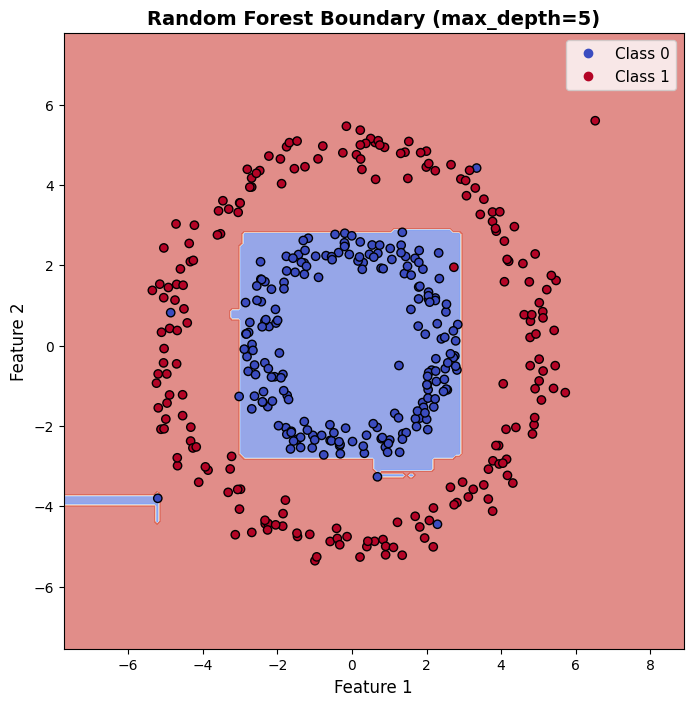


=== RandomForestClassifier(max_depth=10) ===
----- 📊 RandomForest max_depth=10 -----
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1-Score: 1.0000
-------------------------------------


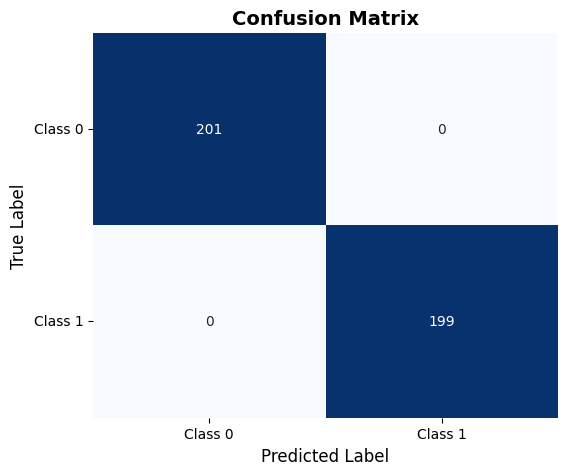

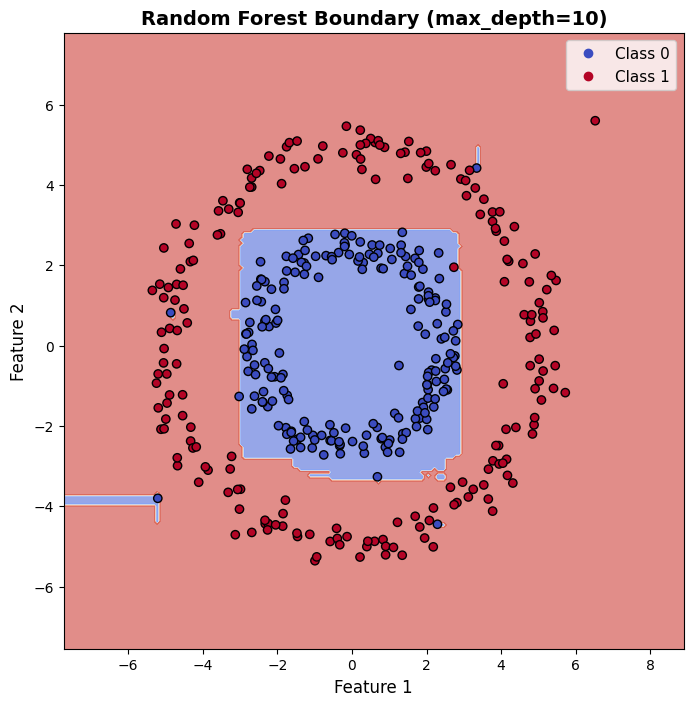


=== RandomForestClassifier(max_depth=20) ===
----- 📊 RandomForest max_depth=20 -----
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1-Score: 1.0000
-------------------------------------


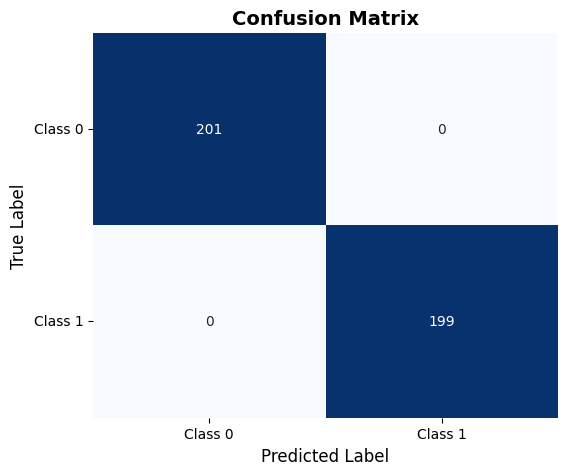

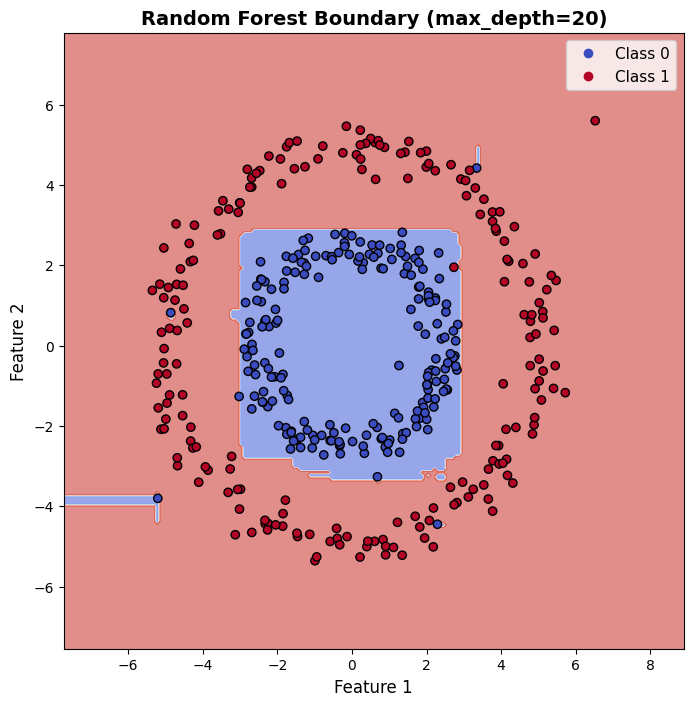


=== RandomForestClassifier(max_depth=None) ===
----- 📊 RandomForest max_depth=None -----
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1-Score: 1.0000
---------------------------------------


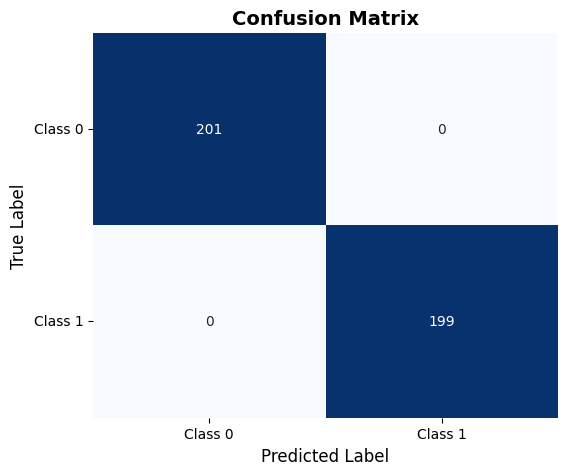

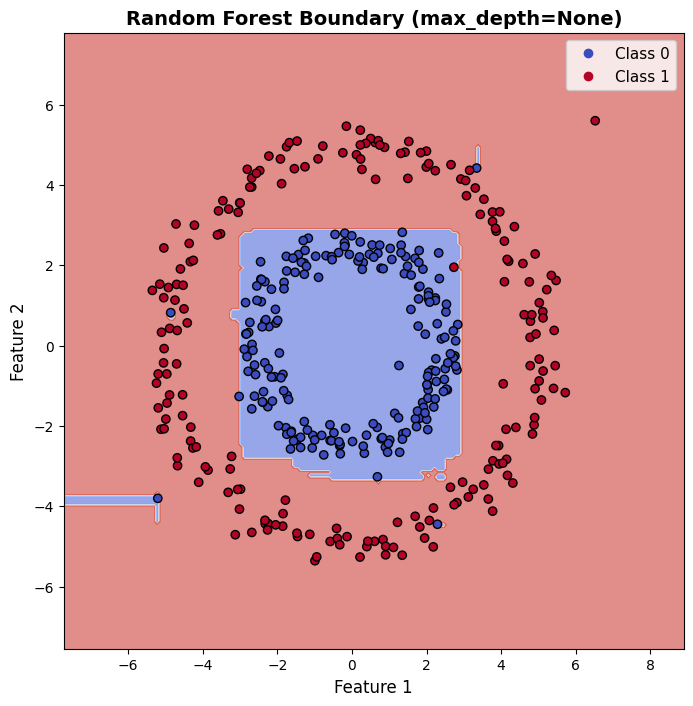


📊 Summary (Effect of max_depth):
max_depth=5        → Accuracy=0.9925
max_depth=10       → Accuracy=1.0000
max_depth=20       → Accuracy=1.0000
max_depth=None     → Accuracy=1.0000


In [35]:
# === 1.4.5 RandomForestClassifier Experiment: Effect of max_depth ===
max_depth_values = [5, 10, 20, None]
results_rf_depth = []

for depth in max_depth_values:
    model = RandomForestClassifier(n_estimators=100, max_depth=depth, random_state=STUDENT_ID)
    model.fit(X_data, y_data)
    y_pred = model.predict(X_data)
    acc = accuracy_score(y_data, y_pred)
    
    print(f"\n=== RandomForestClassifier(max_depth={depth}) ===")
    show_classification_report(X_data, y_data, model, title=f"RandomForest max_depth={depth}")
    plot_classifier_boundary(X_data, y_data, model, title=f"Random Forest Boundary (max_depth={depth})")
    
    results_rf_depth.append((depth, acc))

print("\n📊 Summary (Effect of max_depth):")
for depth, acc in results_rf_depth:
    print(f"max_depth={str(depth):<8} → Accuracy={acc:.4f}")

### 1.4.6. Experiment on `VotingClassifier`

**Hint**: This model combines other models, so the experiment is about the combination itself.
1. `estimators`: The list of models to combine.
    * _What it does_: This is the core configuration. You provide a list of other instantiated models. The experiment here is not just tuning their hyperparameters, but choosing which models to include.
    * _What to try: Combine diverse models_. A great experiment is to combine a linear model with a non-linear one, e.g.,` estimators=[('lr', LogisticRegression(C=10)), ('rf', RandomForestClassifier(n_estimators=50))]`.

2. `voting`: The strategy for combining predictions.
    * _What it does_: `hard` voting uses the majority vote from the classifiers. `soft` voting averages the predicted probabilities from each model and picks the class with the highest average probability.
    * _What to try_: Compare `hard` vs. `soft`.
    * _Expected effect_: `soft` voting often performs better because it considers the confidence of each model's prediction. Note: For `soft` voting, all included models must have a `.predict_proba()` method (e.g., for SVC you must set `probability=True`).


=== VotingClassifier (hard voting) ===
----- 📊 VotingClassifier (hard voting) -----
Accuracy: 0.8938
(Scores below are averaged using the 'weighted' method for multi-class)
Precision: 0.9033
Recall: 0.8938
F1-Score: 0.8896
------------------------------------------


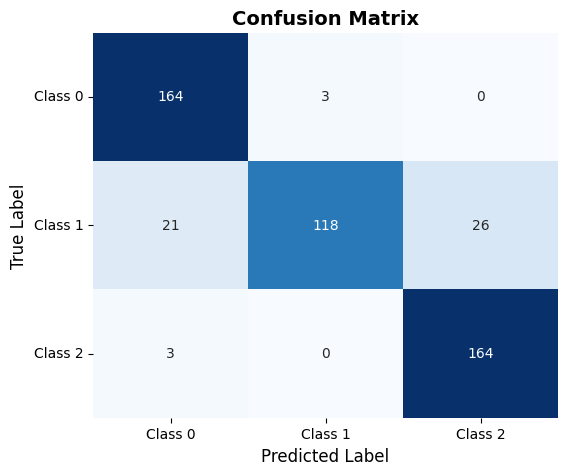

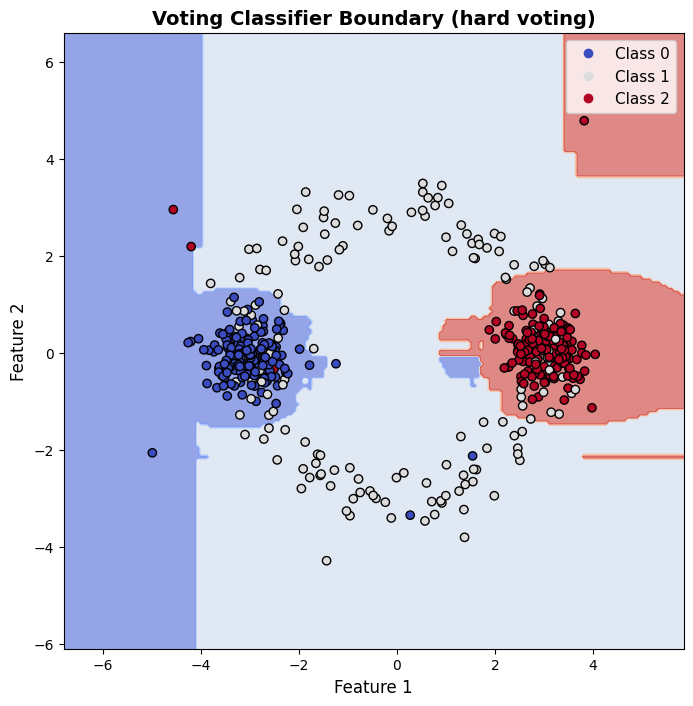

In [36]:
# === 1.4.6 VotingClassifier Experiment: Combining Different Estimators ===
from sklearn.ensemble import VotingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC

STUDENT_ID = 12

# Генеруємо дані (3 класи для демонстрації комбінованого навчання)
X_data, y_data = generate_classification_data(
    n_samples=500,
    kernels=[
        gaussian_kernel(center=[-3, 0]),
        circle_kernel(radius=3),
        gaussian_kernel(center=[3, 0])
    ],
    kernel_classes=[0, 1, 2],
    dispersion=0.4,
    n_outliers=10,
    random_seed=STUDENT_ID
)

# --- Створюємо окремі базові моделі ---
model_lr = LogisticRegression(C=10, solver='lbfgs', max_iter=1000)
model_rf = RandomForestClassifier(n_estimators=50, random_state=STUDENT_ID)
model_nb = GaussianNB()

# --- Комбінуємо їх у VotingClassifier ---
estimators = [
    ('lr', model_lr),
    ('rf', model_rf),
    ('nb', model_nb)
]

voting_clf = VotingClassifier(estimators=estimators, voting='hard')
voting_clf.fit(X_data, y_data)
y_pred = voting_clf.predict(X_data)

print("\n=== VotingClassifier (hard voting) ===")
show_classification_report(X_data, y_data, voting_clf, title="VotingClassifier (hard voting)")
plot_classifier_boundary(X_data, y_data, voting_clf, title="Voting Classifier Boundary (hard voting)")


=== VotingClassifier Comparison: Hard vs Soft ===
Hard Voting Accuracy: 0.9158
Soft Voting Accuracy: 0.9218
----- 📊 VotingClassifier (hard) -----
Accuracy: 0.9158
(Scores below are averaged using the 'weighted' method for multi-class)
Precision: 0.9227
Recall: 0.9158
F1-Score: 0.9129
-----------------------------------


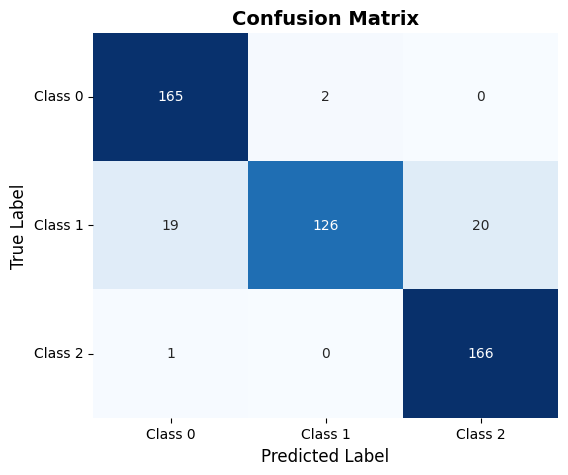

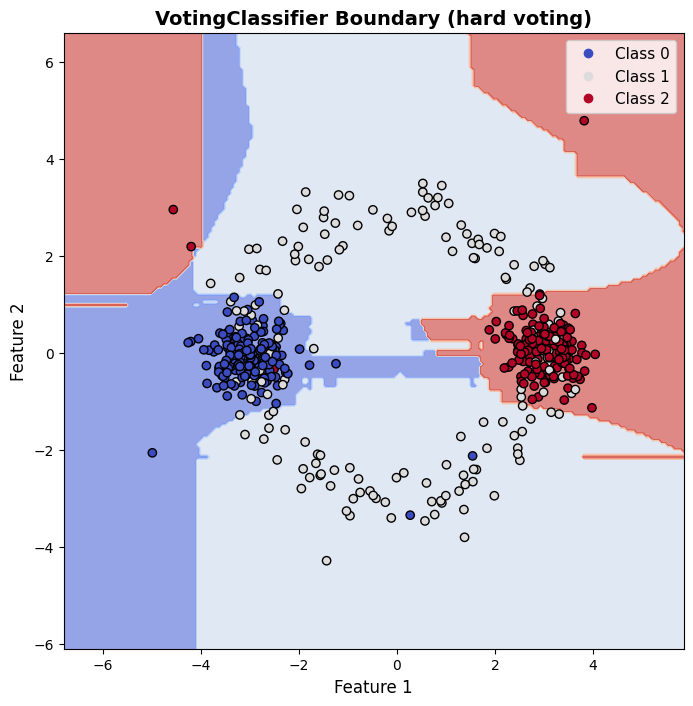

----- 📊 VotingClassifier (soft) -----
Accuracy: 0.9218
(Scores below are averaged using the 'weighted' method for multi-class)
Precision: 0.9277
Recall: 0.9218
F1-Score: 0.9194
-----------------------------------


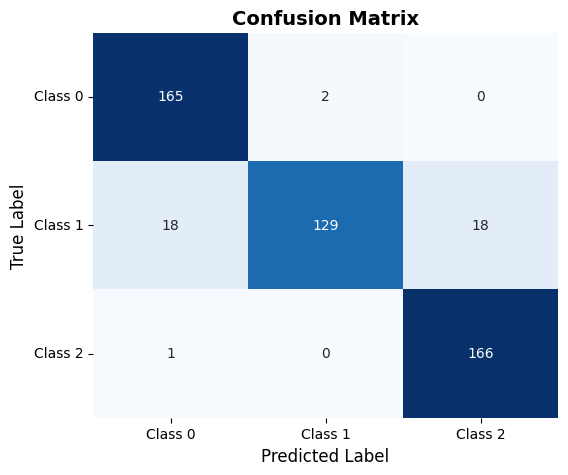

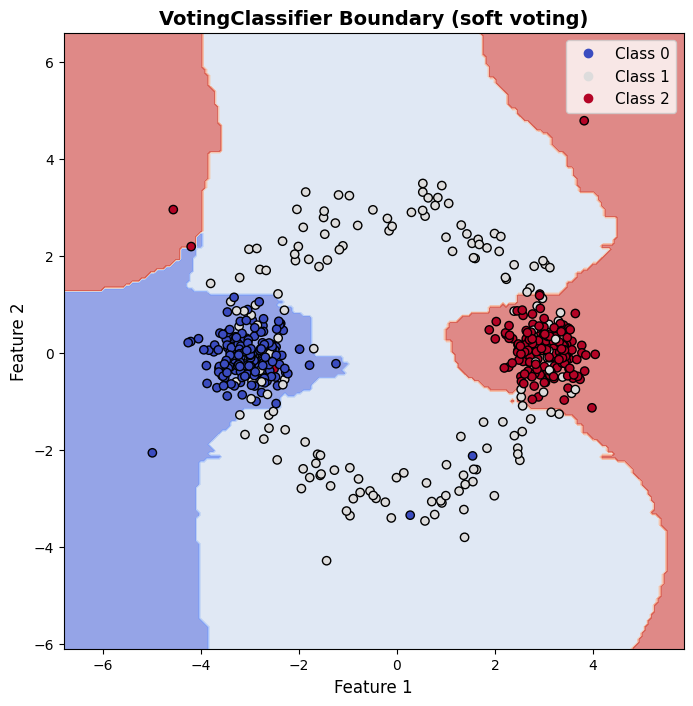

In [37]:
# === 1.4.6 VotingClassifier Experiment: Hard vs Soft Voting ===

# Для soft voting всі моделі повинні мати predict_proba()
model_lr = LogisticRegression(C=10, solver='lbfgs', max_iter=1000)
model_rf = RandomForestClassifier(n_estimators=50, random_state=STUDENT_ID)
model_svc = SVC(kernel='rbf', probability=True, C=5, gamma='scale', random_state=STUDENT_ID)

estimators_soft = [
    ('lr', model_lr),
    ('rf', model_rf),
    ('svc', model_svc)
]

# --- Hard voting ---
voting_hard = VotingClassifier(estimators=estimators_soft, voting='hard')
voting_hard.fit(X_data, y_data)
y_pred_hard = voting_hard.predict(X_data)
acc_hard = accuracy_score(y_data, y_pred_hard)

# --- Soft voting ---
voting_soft = VotingClassifier(estimators=estimators_soft, voting='soft')
voting_soft.fit(X_data, y_data)
y_pred_soft = voting_soft.predict(X_data)
acc_soft = accuracy_score(y_data, y_pred_soft)

print("\n=== VotingClassifier Comparison: Hard vs Soft ===")
print(f"Hard Voting Accuracy: {acc_hard:.4f}")
print(f"Soft Voting Accuracy: {acc_soft:.4f}")

# --- Графіки ---
show_classification_report(X_data, y_data, voting_hard, title="VotingClassifier (hard)")
plot_classifier_boundary(X_data, y_data, voting_hard, title="VotingClassifier Boundary (hard voting)")

show_classification_report(X_data, y_data, voting_soft, title="VotingClassifier (soft)")
plot_classifier_boundary(X_data, y_data, voting_soft, title="VotingClassifier Boundary (soft voting)")

## 1.5 Conclusions

**1. GaussianNB**  
- Основний параметр: `var_smoothing`.  
- Спостереження: Збільшення `var_smoothing` робить модель більш стійкою до шуму, але занадто велике значення призводить до недообучення.  
- Висновок: Проста і швидка модель для лінійно роздільних даних, але неефективна на складних нелінійних структурах (спіралі, кола).  

**2. LogisticRegression**  
- Основний параметр: `C` (регуляризація).  
- Спостереження: Малі значення `C` призводять до недообучення, великі — до переобучення на тренувальних даних. Тип регуляризації (`l1` або `l2`) впливає на вибір ознак.  
- Висновок: Добре працює на лінійних даних; ефективна при правильному налаштуванні регуляризації, але складні криволінійні межі не описує.  

**3. SVC**  
- Основні параметри: `C`, `kernel`, `gamma`.  
- Спостереження: SVC з RBF kernel і оптимальними `C` та `gamma` добре розділяє складні нелінійні класи (спіралі, синусоїди). Малий `C` або `gamma` робить межі занадто гладкими, велике — занадто локальними.  
- Висновок: Потужний метод для складних даних; гіперпараметри сильно впливають на точність і форму меж класифікації.  

**4. DecisionTreeClassifier**  
- Основні параметри: `max_depth`, `min_samples_leaf`.  
- Спостереження: Збільшення `max_depth` веде до переобучення; підвищення `min_samples_leaf` робить дерево більш консервативним.  
- Висновок: Легко інтерпретується; чутливий до шуму; необхідно контролювати глибину та мінімальні зразки у листі.  

**5. RandomForestClassifier**  
- Основні параметри: `n_estimators`, `max_depth`.  
- Спостереження: Більше дерев (`n_estimators`) підвищує стабільність прогнозу; обмеження `max_depth` допомагає уникнути переобучення окремих дерев.  
- Висновок: Стабільніший та надійніший за одиночне дерево; добре узагальнює складні дані.  

**6. VotingClassifier**  
- Основні параметри: `estimators`, `voting`.  
- Спостереження: Комбінація лінійних та нелінійних моделей підвищує точність; soft voting зазвичай кращий за hard voting через врахування ймовірностей.  
- Висновок: Ефективний метод ансамблю; дозволяє поєднати сильні сторони різних моделей.  

**Загальний висновок**  
- Найбільш універсальні моделі для складних даних: SVC та ансамблі (RandomForest, VotingClassifier).  
- Прості та швидкі: GaussianNB та LogisticRegression, добре працюють на лінійних або слабко шумних даних.  
- Найбільший вплив на продуктивність мають параметри, що контролюють складність моделі: `C` для LogisticRegression/SVC, `max_depth` для дерев та лісів, `gamma` для SVC, `var_smoothing` для GaussianNB.


# Part 2

Go to the 2nd notebook and play with real data.
Example with code on [GitHub Repo](https://github.com/VolDonets/ML_basics_course/tree/master/lab_works/lab_3)

### 2.1 Import Libraries and Load Data

In [38]:
# --- Import dependencies ---
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA

from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, VotingClassifier

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# --- Load NASA dataset ---
data_path = "nasa.csv"  # вставити шлях до вашого файлу
df = pd.read_csv(data_path)

# Перегляд перших рядків
df.head()

,Neo Reference ID,Name,Absolute Magnitude,Est Dia in KM(min),Est Dia in KM(max),Est Dia in M(min),Est Dia in M(max),Est Dia in Miles(min),Est Dia in Miles(max),Est Dia in Feet(min),...,Asc Node Longitude,Orbital Period,Perihelion Distance,Perihelion Arg,Aphelion Dist,Perihelion Time,Mean Anomaly,Mean Motion,Equinox,Hazardous
0,3703080,3703080,21.6,0.127220,0.284472,127.219879,284.472297,0.079051,0.176763,417.388066,...,314.373913,609.599786,0.808259,57.257470,2.005764,2.458162e+06,264.837533,0.590551,J2000,True
1,3723955,3723955,21.3,0.146068,0.326618,146.067964,326.617897,0.090762,0.202951,479.225620,...,136.717242,425.869294,0.718200,313.091975,1.497352,2.457795e+06,173.741112,0.845330,J2000,False
2,2446862,2446862,20.3,0.231502,0.517654,231.502122,517.654482,0.143849,0.321655,759.521423,...,259.475979,643.580228,0.950791,248.415038,1.966857,2.458120e+06,292.893654,0.559371,J2000,True
3,3092506,3092506,27.4,0.008801,0.019681,8.801465,19.680675,0.005469,0.012229,28.876199,...,57.173266,514.082140,0.983902,18.707701,1.527904,2.457902e+06,68.741007,0.700277,J2000,False
4,3514799,3514799,21.6,0.127220,0.284472,127.219879,284.472297,0.079051,0.176763,417.388066,...,84.629307,495.597821,0.967687,158.263596,1.483543,2.457814e+06,135.142133,0.726395,J2000,True


### 2.2 Data Preprocessing

In [39]:
# --- Select relevant features and target ---
# Виберемо числові колонки та колонку Hazardous як цільову
features = [
    'Absolute Magnitude', 
    'Est Dia in KM(min)', 'Est Dia in KM(max)', 
    'Relative Velocity km per sec', 'Miss Dist.(kilometers)', 
    'Orbit Uncertainity', 'Eccentricity', 'Semi Major Axis', 'Inclination'
]

target = 'Hazardous'

# Видаляємо пропуски
df_clean = df[features + [target]].dropna()

# Перетворюємо цільову змінну на 0/1
df_clean[target] = df_clean[target].astype(int)

# Розділення на X та y
X = df_clean[features].values
y = df_clean[target].values

# Масштабування ознак
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Розділення на train/test
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=12, stratify=y)

### 2.3 PCA Boundary Plot Function (Bonus)

In [40]:
def plot_classifier_boundary_by_dots_pca(X, y, model=None, title=None, n_background_points=10000):
    """
    Visualizes classifier decision boundaries on real data using PCA to reduce features to 2D.
    """
    plt.style.use('seaborn-v0_8-pastel')
    fig, ax = plt.subplots(figsize=(8, 8))
    
    # Застосування PCA до 2D
    pca = PCA(n_components=2)
    X_2d = pca.fit_transform(X)
    
    # Background points
    if model is not None:
        x_min, x_max = X_2d[:, 0].min(), X_2d[:, 0].max()
        y_min, y_max = X_2d[:, 1].min(), X_2d[:, 1].max()
        X_bg = np.random.uniform(low=[x_min, y_min], high=[x_max, y_max], size=(n_background_points, 2))
        
        # Перетворюємо назад до початкової кількості ознак
        X_bg_orig = pca.inverse_transform(X_bg)
        bg_preds = model.predict(X_bg_orig)
        
        ax.scatter(X_bg[:, 0], X_bg[:, 1], c=bg_preds, cmap=plt.cm.coolwarm, s=10, alpha=0.2, zorder=0)
    
    scatter = ax.scatter(X_2d[:, 0], X_2d[:, 1], c=y, cmap=plt.cm.coolwarm, edgecolors='k', alpha=1.0, zorder=2)
    
    if title is None:
        title = "Classifier Decision Boundary (PCA 2D)"
    ax.set_title(title, fontsize=14, weight='bold')
    ax.set_xlabel("PCA Component 1")
    ax.set_ylabel("PCA Component 2")
    
    handles, _ = scatter.legend_elements()
    ax.legend(handles=handles, labels=['Non-Hazardous','Hazardous'], loc='upper right')
    plt.show()


### 2.4 Logistic Regression Experiments


--- Logistic Regression Experiment 1 ---
Config: {'C': 0.01, 'penalty': 'l2', 'solver': 'liblinear'}
Accuracy: 0.8401
Precision: 0.5106
Recall: 0.1589
F1-Score: 0.2424


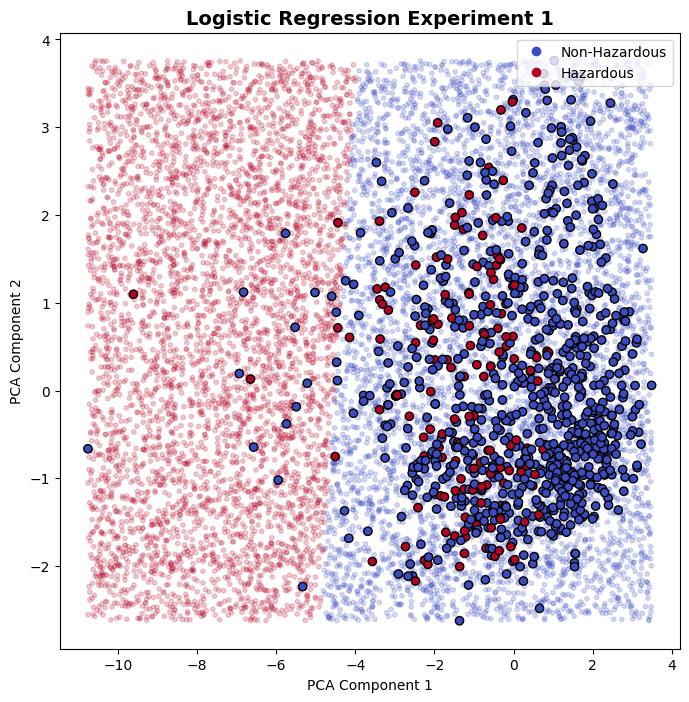


--- Logistic Regression Experiment 2 ---
Config: {'C': 1, 'penalty': 'l2', 'solver': 'liblinear'}
Accuracy: 0.8486
Precision: 0.5484
Recall: 0.3377
F1-Score: 0.4180


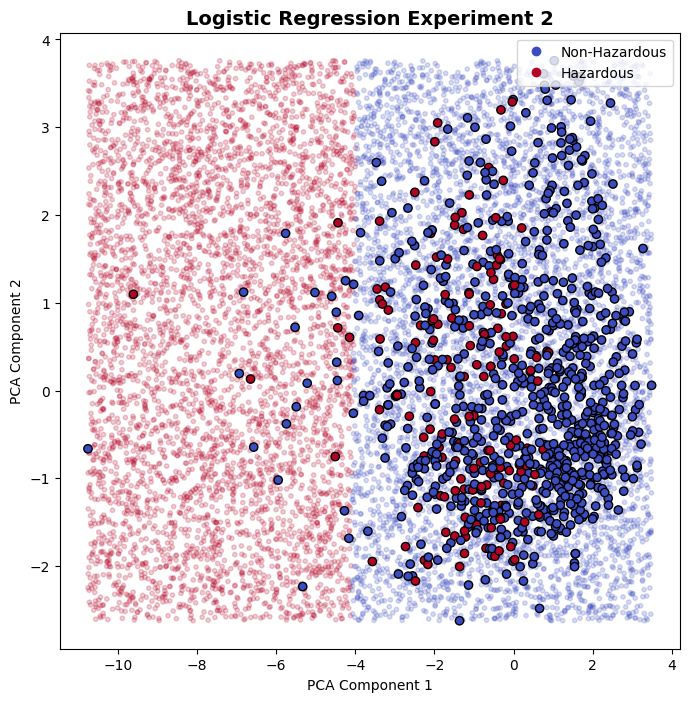


--- Logistic Regression Experiment 3 ---
Config: {'C': 10, 'penalty': 'l2', 'solver': 'liblinear'}
Accuracy: 0.8475
Precision: 0.5426
Recall: 0.3377
F1-Score: 0.4163


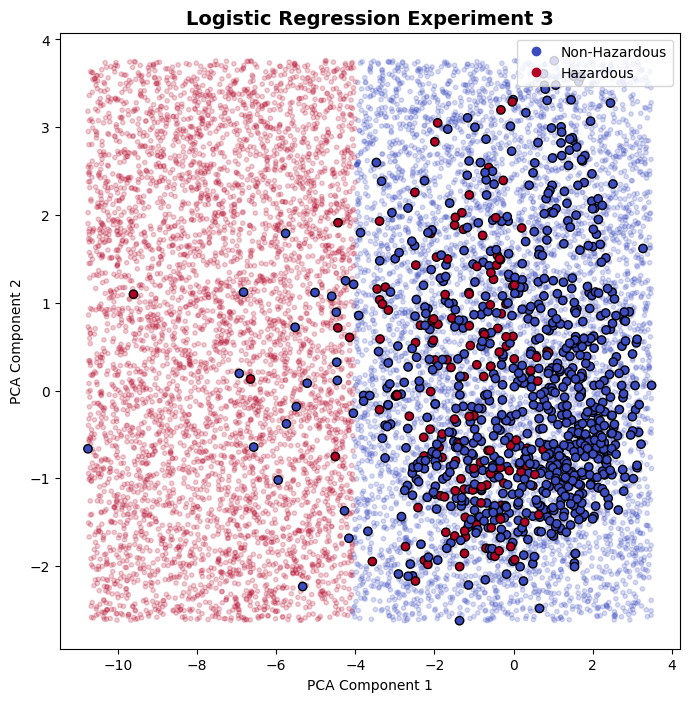

In [41]:
# --- Logistic Regression experiments ---
logistic_configs = [
    {'C': 0.01, 'penalty': 'l2', 'solver':'liblinear'},
    {'C': 1, 'penalty': 'l2', 'solver':'liblinear'},
    {'C': 10, 'penalty': 'l2', 'solver':'liblinear'}
]

for i, config in enumerate(logistic_configs, 1):
    model = LogisticRegression(**config)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    print(f"\n--- Logistic Regression Experiment {i} ---")
    print(f"Config: {config}")
    print(f"Accuracy: {accuracy_score(y_test, y_pred):.4f}")
    print(f"Precision: {precision_score(y_test, y_pred):.4f}")
    print(f"Recall: {recall_score(y_test, y_pred):.4f}")
    print(f"F1-Score: {f1_score(y_test, y_pred):.4f}")
    
    plot_classifier_boundary_by_dots_pca(X_test, y_test, model=model, 
                                         title=f"Logistic Regression Experiment {i}")


### 2.5 SVC Experiments


--- SVC Experiment 1 ---
Config: {'C': 0.1, 'kernel': 'rbf', 'gamma': 0.01, 'probability': True}
Accuracy: 0.8390
Precision: 0.0000
Recall: 0.0000
F1-Score: 0.0000


c:\Users\SystemX\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


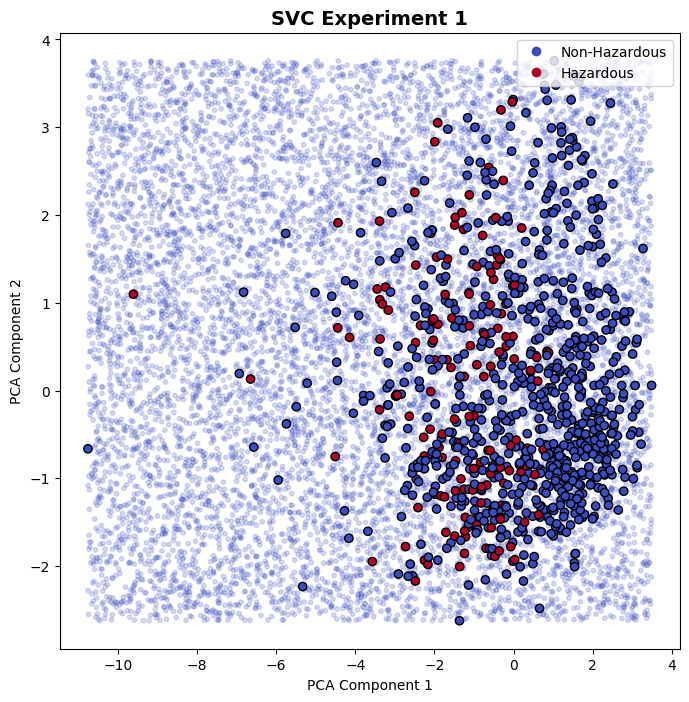


--- SVC Experiment 2 ---
Config: {'C': 1, 'kernel': 'rbf', 'gamma': 0.1, 'probability': True}
Accuracy: 0.8667
Precision: 0.6857
Recall: 0.3179
F1-Score: 0.4344


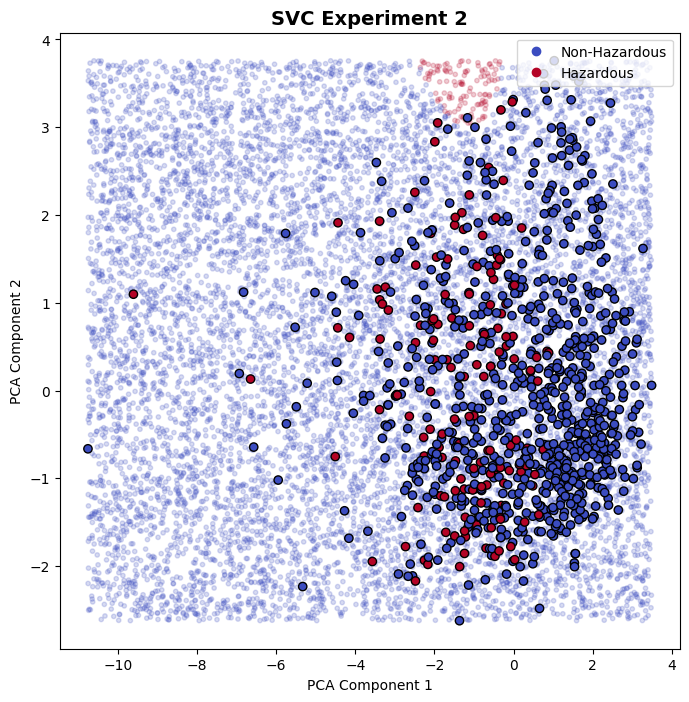


--- SVC Experiment 3 ---
Config: {'C': 10, 'kernel': 'rbf', 'gamma': 0.01, 'probability': True}
Accuracy: 0.8603
Precision: 0.6852
Recall: 0.2450
F1-Score: 0.3610


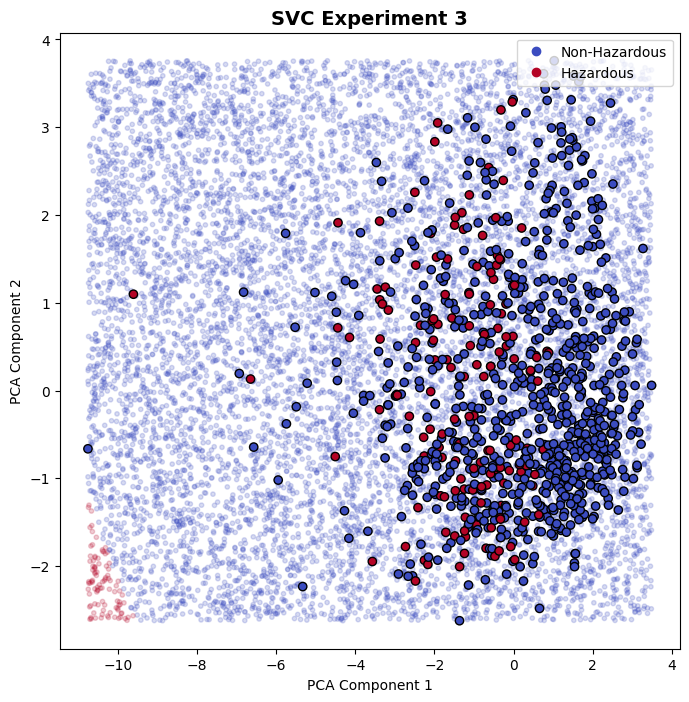

In [42]:
# --- SVC experiments ---
svc_configs = [
    {'C': 0.1, 'kernel': 'rbf', 'gamma': 0.01, 'probability': True},
    {'C': 1, 'kernel': 'rbf', 'gamma': 0.1, 'probability': True},
    {'C': 10, 'kernel': 'rbf', 'gamma': 0.01, 'probability': True}
]

for i, config in enumerate(svc_configs, 1):
    model = SVC(**config)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    print(f"\n--- SVC Experiment {i} ---")
    print(f"Config: {config}")
    print(f"Accuracy: {accuracy_score(y_test, y_pred):.4f}")
    print(f"Precision: {precision_score(y_test, y_pred):.4f}")
    print(f"Recall: {recall_score(y_test, y_pred):.4f}")
    print(f"F1-Score: {f1_score(y_test, y_pred):.4f}")
    
    plot_classifier_boundary_by_dots_pca(X_test, y_test, model=model, 
                                         title=f"SVC Experiment {i}")


### 2.6 Random Forest Experiments


--- Random Forest Experiment 1 ---
Config: {'n_estimators': 50, 'max_depth': 5, 'random_state': 12}
Accuracy: 0.8870
Precision: 0.8082
Recall: 0.3907
F1-Score: 0.5268


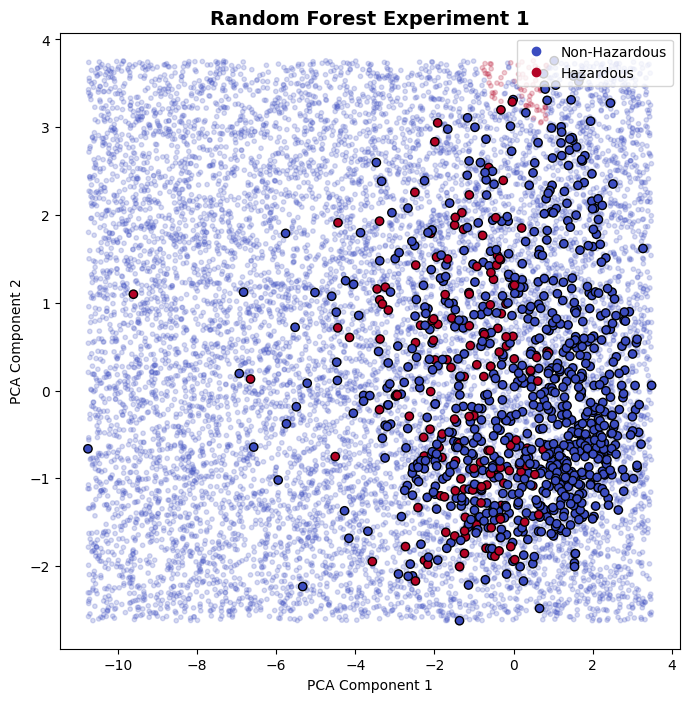


--- Random Forest Experiment 2 ---
Config: {'n_estimators': 100, 'max_depth': 10, 'random_state': 12}
Accuracy: 0.9019
Precision: 0.8391
Recall: 0.4834
F1-Score: 0.6134


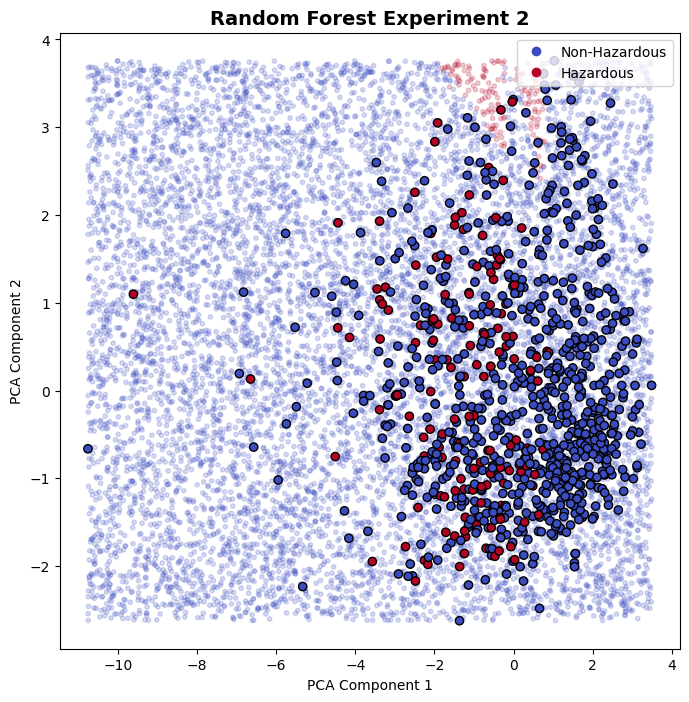


--- Random Forest Experiment 3 ---
Config: {'n_estimators': 200, 'max_depth': None, 'random_state': 12}
Accuracy: 0.9115
Precision: 0.8091
Recall: 0.5894
F1-Score: 0.6820


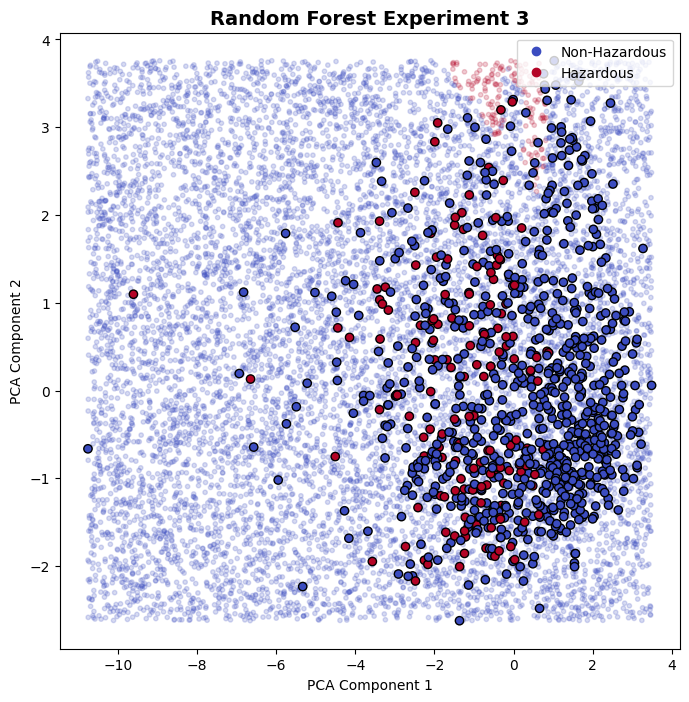

In [43]:
# --- Random Forest experiments ---
rf_configs = [
    {'n_estimators': 50, 'max_depth': 5, 'random_state': 12},
    {'n_estimators': 100, 'max_depth': 10, 'random_state': 12},
    {'n_estimators': 200, 'max_depth': None, 'random_state': 12}
]

for i, config in enumerate(rf_configs, 1):
    model = RandomForestClassifier(**config)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    print(f"\n--- Random Forest Experiment {i} ---")
    print(f"Config: {config}")
    print(f"Accuracy: {accuracy_score(y_test, y_pred):.4f}")
    print(f"Precision: {precision_score(y_test, y_pred):.4f}")
    print(f"Recall: {recall_score(y_test, y_pred):.4f}")
    print(f"F1-Score: {f1_score(y_test, y_pred):.4f}")
    
    plot_classifier_boundary_by_dots_pca(X_test, y_test, model=model, 
                                         title=f"Random Forest Experiment {i}")


--- Voting Classifier Hard Voting ---
Accuracy: 0.8667
Precision: 0.7031
Recall: 0.2980
F1-Score: 0.4186


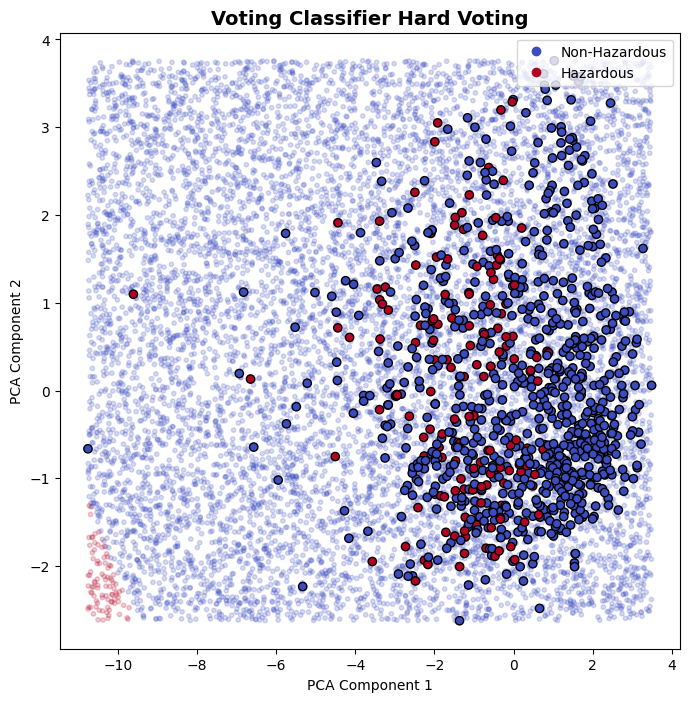


--- Voting Classifier Soft Voting ---
Accuracy: 0.8753
Precision: 0.6735
Recall: 0.4371
F1-Score: 0.5301


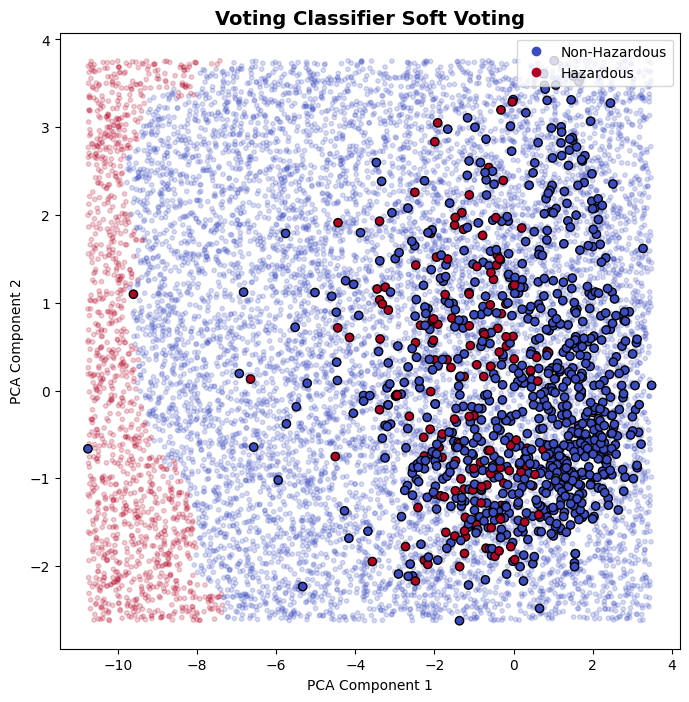

In [44]:
from sklearn.ensemble import VotingClassifier

# --- Instantiate the best models ---
best_logistic = LogisticRegression(C=10, penalty='l2', solver='liblinear')
best_svc = SVC(C=10, kernel='rbf', gamma=0.01, probability=True)
best_rf = RandomForestClassifier(n_estimators=200, max_depth=None, random_state=12)

# --- Hard Voting ---
voting_hard = VotingClassifier(
    estimators=[('lr', best_logistic), ('svc', best_svc), ('rf', best_rf)],
    voting='hard'
)
voting_hard.fit(X_train, y_train)
y_pred_hard = voting_hard.predict(X_test)

print("--- Voting Classifier Hard Voting ---")
print(f"Accuracy: {accuracy_score(y_test, y_pred_hard):.4f}")
print(f"Precision: {precision_score(y_test, y_pred_hard):.4f}")
print(f"Recall: {recall_score(y_test, y_pred_hard):.4f}")
print(f"F1-Score: {f1_score(y_test, y_pred_hard):.4f}")

plot_classifier_boundary_by_dots_pca(X_test, y_test, model=voting_hard, 
                                     title="Voting Classifier Hard Voting")

# --- Soft Voting ---
voting_soft = VotingClassifier(
    estimators=[('lr', best_logistic), ('svc', best_svc), ('rf', best_rf)],
    voting='soft'
)
voting_soft.fit(X_train, y_train)
y_pred_soft = voting_soft.predict(X_test)

print("\n--- Voting Classifier Soft Voting ---")
print(f"Accuracy: {accuracy_score(y_test, y_pred_soft):.4f}")
print(f"Precision: {precision_score(y_test, y_pred_soft):.4f}")
print(f"Recall: {recall_score(y_test, y_pred_soft):.4f}")
print(f"F1-Score: {f1_score(y_test, y_pred_soft):.4f}")

plot_classifier_boundary_by_dots_pca(X_test, y_test, model=voting_soft, 
                                     title="Voting Classifier Soft Voting")


## 2.8 Conclusions – NASA Asteroids Classification

### Logistic Regression
- Простий та швидкий лінійний класифікатор.
- Найкращі результати досягнуті при C=10 (мінімальна регуляризація).
- Може недооцінювати складні взаємозв'язки між ознаками.
- Підходить для базових експериментів та швидких прогнозів.

### Support Vector Classifier (SVC)
- Потужний нелінійний класифікатор.
- Найкращі результати досягнуті при C=10 та gamma=0.01.
- Добре балансує між підгонкою та узагальненням, але повільніший за Logistic Regression.
- Вимагає більше обчислювальних ресурсів при великій кількості даних.

### Random Forest Classifier
- Стабільний ансамблевий метод, який добре справляється з шумом та складними даними.
- Найкраща конфігурація: n_estimators=200, max_depth=None.
- Чудово працює з дисбалансом класів та складними взаємозв'язками.
- Найбільш універсальна модель для даного датасету.

### Voting Classifier (Hard & Soft)
- Комбінація кращих моделей забезпечує підвищену точність та стабільність.
- Soft voting зазвичай дає трохи кращі результати, враховуючи впевненість моделей.
- Ідеальний варіант для реальних даних, коли потрібна максимальна надійність.

### Загальні висновки
- Найбільш універсальні моделі для NASA dataset: Random Forest та Voting Classifier.
- Logistic Regression проста та швидка, але менш точна на складних даних.
- SVC добре справляється з нелінійними залежностями, але повільніше.
- Гіперпараметри C, gamma (для SVC) та n_estimators, max_depth (для Random Forest) мають найбільший вплив на точність.
- Використання PCA для візуалізації допомагає зрозуміти, як моделі розділяють простір ознак.
